In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
sns.set(style="white", context='poster')
import math
from scipy.integrate import solve_ivp

In [2]:
%load_ext autoreload
%autoreload 2


In [3]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [4]:
morder = ['MIN', 'OVERFLOW', 'MIXOTROPH', 'EXOENZYME', 'ROS',]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
sns.color_palette(mpalette, n_colors=5)


[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [5]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [6]:
plt.rcParams['figure.dpi']= 300

In [7]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [8]:
refdf = pd.read_excel('reference_10cc_axenic.xlsx')
refp99df = pd.read_excel('reference_pro99_axenic.xlsx')


In [9]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [10]:
os.listdir(dpath)

['monte_ponly_clean_mse.csv.gz',
 'monte2_ponly_sum.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_ponly_fix_OVERFLOW_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_add_het_mse.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'monte_ponly_fix_OVERFLOW_clean_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte2_add_het_mse.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'monte_add_het_df.csv.gz',
 'sensitivity_vmax_mse.csv.gz',
 'monte_ponly_mse.csv.gz',
 'monte2_add_het_sum.csv.gz',
 'monte_ponly_sum.csv.gz',
 'monte_het_clean_mse.csv.gz',
 'monte_strong_ponly_df.csv.gz',
 'sensitivity_sum.csv.gz',
 'sensit

In [11]:
pro99_mode = False 
which_organism = 'ponly'
organism_to_tune = 'PRO'
(var_names, init_var_vals, intermediate_names, calc_dydt, prepare_params_tuple
) = get_constants_per_organism(pro99_mode, which_organism)
for model in ['OVERFLOW', 'MIXOTROPH', 'ROS', 'MIN', 'EXOENZYME']:
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    


In [12]:
df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_OVERFLOW_clean_df.csv.gz',))
mse_df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_OVERFLOW_clean_mse.csv.gz',))
sum_df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_OVERFLOW_clean_sum.csv.gz',))

In [13]:
sum_df.run_id.head().unique()

array(['monte_ponly_fix_OVERFLOW_33_monte__91_lowN_ponly_OVERFLOW_h6878164821315599434',
       'monte_ponly_fix_OVERFLOW_85_monte__7_pro99_ponly_OVERFLOW_h6878164821315599434',
       'monte_ponly_fix_OVERFLOW_5_monte__8_pro99_ponly_OVERFLOW_h6878164821315599434',
       'monte_ponly_fix_OVERFLOW_28_monte__59_pro99_ponly_OVERFLOW_h6878164821315599434',
       'monte_ponly_fix_OVERFLOW_24_monte__91_pro99_ponly_OVERFLOW_h6878164821315599434'],
      dtype=object)

In [14]:
sum_df[['id', 'media', 'which', 'model', 'hash']] = sum_df.run_id.str.rsplit('_', n=4, expand=True)
mse_df[['id', 'media', 'which', 'model', 'hash']] = mse_df.run_id.str.rsplit('_', n=4, expand=True)
df    [['id', 'media', 'which', 'model', 'hash']] =     df.run_id.str.rsplit('_', n=4, expand=True)

sum_df['idx'] = sum_df['id'] + '_' + sum_df['model']
mse_df['idx'] = mse_df['id'] + '_' + mse_df['model']
df    ['idx'] =     df['id'] + '_' +     df['model']

In [15]:
mse_df['RMSE'] = np.sqrt(mse_df['RMSE'])

In [16]:
mse_df.groupby('media').compare_points.describe()

,count,mean,std,min,25%,50%,75%,max
media,,,,,,,,
lowN,29865.0,74.0,0.0,74.0,74.0,74.0,74.0,74.0
pro99,29865.0,58.0,0.0,58.0,58.0,58.0,58.0,58.0


In [17]:
mse_df['ref_compare_points'] = mse_df.media.map({'lowN' : 74, 'pro99': 58})
bad_ids_missing_points = set(mse_df.loc[mse_df.ref_compare_points != mse_df.compare_points, 'idx' ])
len(bad_ids_missing_points)

0

In [18]:
min_values = df[var_names+ ['idx']].groupby('idx').min().min(axis=1)
bad_ids_negative_values = set(min_values[min_values< -1e-9].index)
len(bad_ids_negative_values)

0

In [19]:
min_values

idx
monte_ponly_fix_OVERFLOW_100_monte__0_OVERFLOW    -7.120732e-22
monte_ponly_fix_OVERFLOW_100_monte__10_OVERFLOW    0.000000e+00
monte_ponly_fix_OVERFLOW_100_monte__11_OVERFLOW    0.000000e+00
monte_ponly_fix_OVERFLOW_100_monte__12_OVERFLOW    0.000000e+00
monte_ponly_fix_OVERFLOW_100_monte__13_OVERFLOW    0.000000e+00
                                                       ...     
monte_ponly_fix_OVERFLOW_9_monte__96_OVERFLOW      0.000000e+00
monte_ponly_fix_OVERFLOW_9_monte__97_OVERFLOW      0.000000e+00
monte_ponly_fix_OVERFLOW_9_monte__98_OVERFLOW      0.000000e+00
monte_ponly_fix_OVERFLOW_9_monte__99_OVERFLOW      0.000000e+00
monte_ponly_fix_OVERFLOW_9_monte__9_OVERFLOW       0.000000e+00
Length: 9955, dtype: float64

In [20]:
bad_ids = bad_ids_missing_points | bad_ids_negative_values
len(bad_ids)

0

In [21]:
mse_df = mse_df.loc[~mse_df.idx.isin(bad_ids)].copy()
sum_df = sum_df.loc[~sum_df.idx.isin(bad_ids)].copy()
df     =     df.loc[    ~df.idx.isin(bad_ids)].copy()


In [22]:
sum_df.idx.nunique()

9955

In [23]:
# represent FL 0.1
NBIOMASS_LOD_NOT_GROWING = 2.34502821

In [24]:
mse_df.groupby('media')[['RMSE']].describe().T

media               lowN         pro99
RMSE count  29865.000000  29865.000000
     mean      50.123225    289.772335
     std       30.037900    262.929136
     min        7.874925     60.486493
     25%       33.189535    136.761491
     50%       34.032501    140.430616
     75%       52.289310    371.057102
     max      185.901468   1515.023871

In [25]:
#mse_df['RMSE'] = mse_df['RMSE'].clip(upper=1e5)

In [26]:
sum_df['model'].value_counts()

OVERFLOW    19910
Name: model, dtype: int64

In [27]:
#mean_scores_1 = mse_df.groupby(['model', 'idx', 'media'], as_index=False)[['RMSE_clip', 'lRMSE_clip']].mean()
mean_scores = mse_df.pivot_table(index=['model', 'idx'], columns='media', values='RMSE' )
mean_scores
#mean_scores.columns = ['_'.join(col).strip() for col in mean_scores.columns.values]
mean_scores.rename(columns={'lowN': 'RMSE_lowN', 'pro99': 'RMSE_pro99'}, inplace=True)

mean_scores = mean_scores.reset_index()
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99
0,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__0_OVERFLOW,33.222816,136.545519
1,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__10_OVERFLOW,58.382552,395.252781
2,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__11_OVERFLOW,100.568824,301.654478
3,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__12_OVERFLOW,52.376729,336.820638
4,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__13_OVERFLOW,102.276236,792.990005
...,...,...,...,...
9950,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__96_OVERFLOW,49.135875,335.618108
9951,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__97_OVERFLOW,33.813245,136.102422
9952,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__98_OVERFLOW,43.588453,248.158848
9953,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__99_OVERFLOW,153.258825,1181.632047


In [28]:
mean_scores['RMSE'] = np.sqrt(mean_scores['RMSE_lowN']*  mean_scores['RMSE_pro99'])


In [29]:
mean_scores.groupby('model').describe().T

model                OVERFLOW
media                        
RMSE_lowN  count  9955.000000
           mean     50.123225
           std      30.031571
           min       8.436149
           25%      33.222644
           50%      33.222876
           75%      52.246218
           max     185.233451
RMSE_pro99 count  9955.000000
           mean    289.772335
           std     262.923635
           min      61.012915
           25%     136.544686
           50%     136.546008
           75%     370.820108
           max    1511.288937
RMSE       count  9955.000000
           mean    118.962821
           std      89.063732
           min      28.796734
           25%      67.352687
           50%      67.353181
           75%     135.798655
           max     527.299148

In [30]:
sns.set_context('poster')

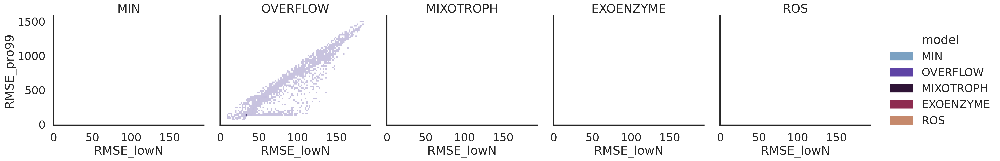

In [31]:
sns.displot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder,
).set_titles(col_template='{col_name}', row_template='{row_name}')

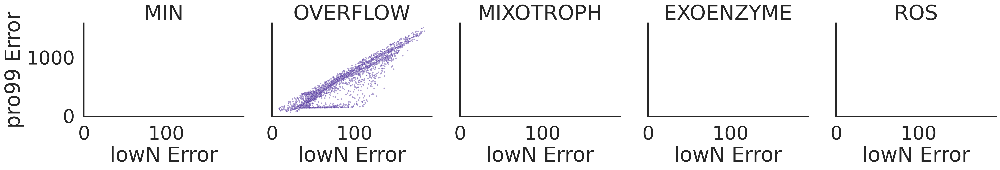

In [32]:
sns.set_context('poster',  font_scale=1.5)
g = sns.relplot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder, #col_wrap=3,
    legend=False, s=7, alpha=0.5,
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(xlabel='lowN Error', ylabel='pro99 Error', )
plt.savefig('figures/ponly_sobol_error.svg')

In [33]:
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE
0,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__0_OVERFLOW,33.222816,136.545519,67.353000
1,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__10_OVERFLOW,58.382552,395.252781,151.907426
2,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__11_OVERFLOW,100.568824,301.654478,174.175303
3,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__12_OVERFLOW,52.376729,336.820638,132.821547
4,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__13_OVERFLOW,102.276236,792.990005,284.787697
...,...,...,...,...,...
9950,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__96_OVERFLOW,49.135875,335.618108,128.416858
9951,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__97_OVERFLOW,33.813245,136.102422,67.838518
9952,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__98_OVERFLOW,43.588453,248.158848,104.004136
9953,OVERFLOW,monte_ponly_fix_OVERFLOW_9_monte__99_OVERFLOW,153.258825,1181.632047,425.553215


In [34]:
mean_scores_filtered = mean_scores.sort_values(
    by='RMSE',
)
#pmaxday_df #.loc[pmaxday_df[f'score_4'].ge(4)].copy()

In [35]:
mean_scores_filtered['lrank'] = mean_scores_filtered.groupby("model")["RMSE"].rank(method='first')
mean_scores_filtered['fit'] = 'bad'
#mean_scores_filtered.loc[mean_scores_filtered.lrank.le(100), 'fit'] = 'good'
mean_scores_filtered.loc[mean_scores_filtered.RMSE.le(60), 'fit'] = 'good'



In [36]:
mean_scores_filtered.fit.value_counts()

bad     9900
good      55
Name: fit, dtype: int64

In [37]:
bestids = mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good']), 'idx']

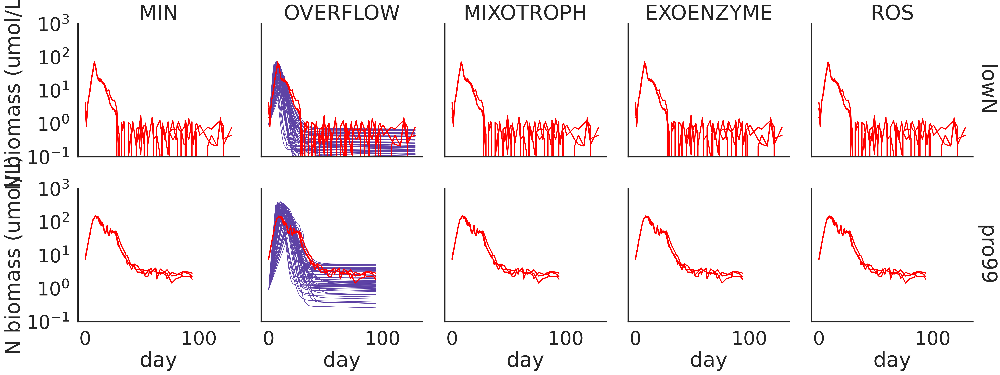

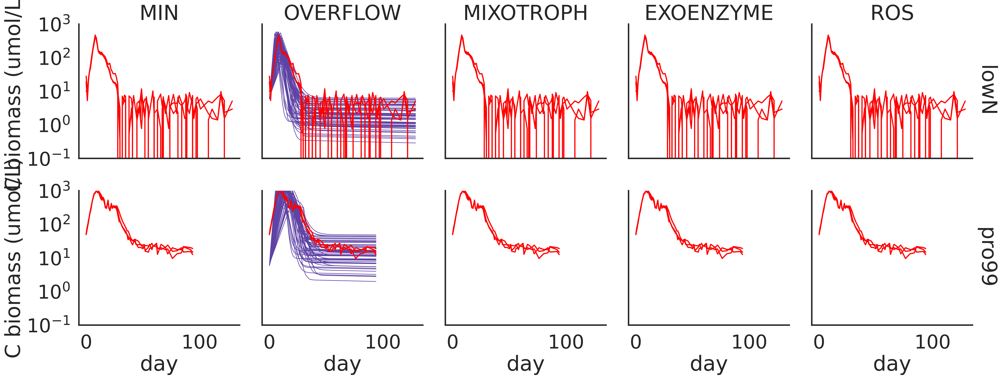

In [38]:
for n in ('N', 'C'):
    l= 'RMSE'
    g = sns.relplot(
        data=df.loc[df.idx.isin(bestids)],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='model', hue_order=morder, palette=mpalette,
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

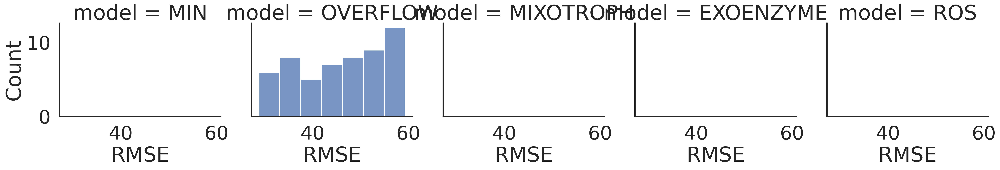

In [39]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE',
    col='model', col_order=morder,
)

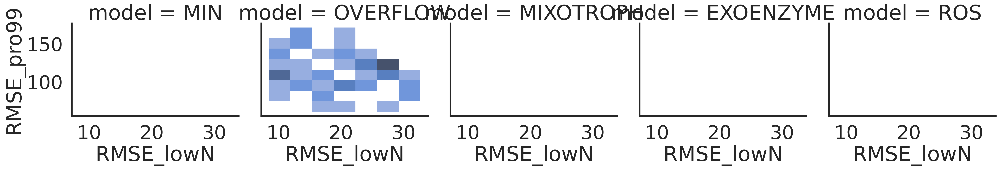

In [40]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE_lowN', y='RMSE_pro99',
    col='model', col_order=morder,
)

In [41]:
mean_scores_filtered.loc[mean_scores_filtered.idx.isin(bestids)].model.value_counts()


OVERFLOW    55
Name: model, dtype: int64

In [42]:
mean_scores_filtered.model.value_counts()


OVERFLOW    9955
Name: model, dtype: int64

In [43]:
362/2607,149/995

(0.13885692366705024, 0.14974874371859295)

In [44]:
t = mean_scores_filtered[['fit']].value_counts().reset_index()
t['%'] = 100 * t[0] / t[0].sum()
t

,fit,0,%
0,bad,9900,99.447514
1,good,55,0.552486


In [45]:
mean_scores_filtered.pivot_table(columns='fit', index='model',values='idx', aggfunc='count')

fit,bad,good
model,,
OVERFLOW,9900,55


In [46]:
min_rows = mean_scores_filtered.loc[mean_scores_filtered['fit'].isin(['good'])]
min_rows

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit
7839,OVERFLOW,monte_ponly_fix_OVERFLOW_80_monte__73_OVERFLOW,9.776044,84.824891,28.796734,1.0,good
6288,OVERFLOW,monte_ponly_fix_OVERFLOW_67_monte__20_OVERFLOW,8.936707,108.746890,31.174334,2.0,good
55,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__5_OVERFLOW,10.596184,94.520130,31.647318,3.0,good
8125,OVERFLOW,monte_ponly_fix_OVERFLOW_83_monte__63_OVERFLOW,9.028391,113.961018,32.076232,4.0,good
8965,OVERFLOW,monte_ponly_fix_OVERFLOW_91_monte__13_OVERFLOW,9.062687,115.735800,32.386376,5.0,good
2539,OVERFLOW,monte_ponly_fix_OVERFLOW_32_monte__57_OVERFLOW,8.436149,128.831446,32.967276,6.0,good
1436,OVERFLOW,monte_ponly_fix_OVERFLOW_22_monte__50_OVERFLOW,11.951082,100.405093,34.640287,7.0,good
4089,OVERFLOW,monte_ponly_fix_OVERFLOW_47_monte__15_OVERFLOW,18.144291,70.165541,35.680583,8.0,good
9563,OVERFLOW,monte_ponly_fix_OVERFLOW_97_monte__16_OVERFLOW,13.020297,101.121896,36.285495,9.0,good
5306,OVERFLOW,monte_ponly_fix_OVERFLOW_58_monte__32_OVERFLOW,11.664197,114.529094,36.549828,10.0,good


### vmax per cell

uMN_per_cell = Qp = 12.5 fg/cell * 1e-9 fg->uM  / 14 (N MW)

vmax_per_sec_per_uMN = uM sec -1 uM N -1

vmax_per_day_per_uMN = vmax_per_sec_per_uMN * seconds_in_day

vmax_per_day_per_cell = vmax_per_day_per_uMN * Qp




In [47]:
#     resources* = paramkns / (paramvmax/paramM - 1)

sum_df['Vmax/K ICp'] = sum_df['VmaxICp'] / sum_df['KICp']
sum_df['Vmax/K INp'] = sum_df['VmaxINp'] / sum_df['KINp']
sum_df['R* INp'] = sum_df['KINp'] / (sum_df['VmaxINp'] / sum_df['Mp'] - 1)
sum_df['R* ICp'] = sum_df['KICp'] / (sum_df['VmaxICp'] / sum_df['Mp'] - 1)
sum_df['Vmax/Vmax Ip'] = sum_df['VmaxICp'] / sum_df['VmaxINp']



In [48]:
sum_df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash', 'Vmax/K ICp',
       'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype='object')

In [49]:
additional_variables = [ 'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip']
id_vars= ['model', 'idx']
sum_df1 = sum_df.drop_duplicates(subset='idx')
def _get_params_df(model):
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    print(params_to_update)
    param_vals_map = get_param_vals(model)
    additional_variables_per_day = [
#         f'{p}_day' for p in params_per_second 
#         if p in params_to_update
    ]
    additional_variables_per_day_cell =  [
#         f'{p}_day_cell' for p in vmax_params
#         if p in params_to_update
    ]
    


    param_vals_df = sum_df1.loc[sum_df1.model.isin([model]), 
                                id_vars + params_to_update + additional_variables_per_day + additional_variables + additional_variables_per_day_cell]
    print(param_vals_df)
    mparam_vals = param_vals_df.melt( id_vars=id_vars)    
    mparam_vals['default'] = mparam_vals['variable'].map(param_vals_map)
    mparam_vals['FC'] = np.log2(mparam_vals.value / mparam_vals.default)
    return mparam_vals
model = 'OVERFLOW'
mparams_df = _get_params_df(model) 


['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp', 'Koverflowp']
          model                                             idx       VmaxICp  \
0      OVERFLOW  monte_ponly_fix_OVERFLOW_33_monte__91_OVERFLOW  3.870829e-06   
1      OVERFLOW   monte_ponly_fix_OVERFLOW_85_monte__7_OVERFLOW  1.248922e-05   
2      OVERFLOW    monte_ponly_fix_OVERFLOW_5_monte__8_OVERFLOW  5.555556e-06   
3      OVERFLOW  monte_ponly_fix_OVERFLOW_28_monte__59_OVERFLOW  6.065256e-07   
4      OVERFLOW  monte_ponly_fix_OVERFLOW_24_monte__91_OVERFLOW  2.761397e-05   
...         ...                                             ...           ...   
19361  OVERFLOW  monte_ponly_fix_OVERFLOW_28_monte__19_OVERFLOW  5.555556e-06   
19423  OVERFLOW  monte_ponly_fix_OVERFLOW_47_monte__21_OVERFLOW  8.182179e-06   
19431  OVERFLOW   monte_ponly_fix_OVERFLOW_53_monte__7_OVERFLOW  5.555556e-06   
19754  OVERFLOW  monte_ponly_fix_OVERFLOW_36_monte__18_OVERFLOW  2.890069e-06   
19832  OVERFLOW  monte_ponly_fix_OVERFL

In [50]:
sum_df1

,VmaxICp,VmaxICh,VmaxINp,VmaxINh,VmaxOCp,VmaxOCh,VmaxONp,VmaxONh,KICp,KICh,...,id,media,which,model,hash,Vmax/K ICp,Vmax/K INp,R* INp,R* ICp,Vmax/Vmax Ip
0,3.870829e-06,0.0,0.000006,0.000067,0.0,0.000067,0.0,0.000067,34.936967,1.0,...,monte_ponly_fix_OVERFLOW_33_monte__91,lowN,ponly,OVERFLOW,h6878164821315599434,1.107947e-07,0.000278,-0.045791,-57.503002,0.696749
1,1.248922e-05,0.0,0.000022,0.000067,0.0,0.000067,0.0,0.000067,37.000000,1.0,...,monte_ponly_fix_OVERFLOW_85_monte__7,pro99,ponly,OVERFLOW,h6878164821315599434,3.375464e-07,0.000171,0.030133,18.699365,0.558349
2,5.555556e-06,0.0,0.000006,0.000067,0.0,0.000067,0.0,0.000067,37.000000,1.0,...,monte_ponly_fix_OVERFLOW_5_monte__8,pro99,ponly,OVERFLOW,h6878164821315599434,1.501502e-07,0.000443,0.067857,200.365311,1.000000
3,6.065256e-07,0.0,0.000002,0.000067,0.0,0.000067,0.0,0.000067,22.266346,1.0,...,monte_ponly_fix_OVERFLOW_28_monte__59,pro99,ponly,OVERFLOW,h6878164821315599434,2.723956e-08,0.000601,0.034618,-33.616234,0.308458
4,2.761397e-05,0.0,0.000002,0.000067,0.0,0.000067,0.0,0.000067,59.535579,1.0,...,monte_ponly_fix_OVERFLOW_24_monte__91,pro99,ponly,OVERFLOW,h6878164821315599434,4.638229e-07,0.000099,-0.025110,32.338482,13.959761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19361,5.555556e-06,0.0,0.000049,0.000067,0.0,0.000067,0.0,0.000067,37.000000,1.0,...,monte_ponly_fix_OVERFLOW_28_monte__19,pro99,ponly,OVERFLOW,h6878164821315599434,1.501502e-07,0.002966,0.002191,-1154.664834,0.113217
19423,8.182179e-06,0.0,0.000022,0.000067,0.0,0.000067,0.0,0.000067,37.000000,1.0,...,monte_ponly_fix_OVERFLOW_47_monte__21,lowN,ponly,OVERFLOW,h6878164821315599434,2.211400e-07,0.000258,0.022610,47.863972,0.368794
19431,5.555556e-06,0.0,0.000006,0.000067,0.0,0.000067,0.0,0.000067,37.000000,1.0,...,monte_ponly_fix_OVERFLOW_53_monte__7,pro99,ponly,OVERFLOW,h6878164821315599434,1.501502e-07,0.000452,0.000775,2.331821,1.000000
19754,2.890069e-06,0.0,0.000006,0.000067,0.0,0.000067,0.0,0.000067,3.840946,1.0,...,monte_ponly_fix_OVERFLOW_36_monte__18,pro99,ponly,OVERFLOW,h6878164821315599434,7.524368e-07,0.000236,0.006191,2.565728,0.520212


In [51]:
mparams_df = pd.merge(mean_scores_filtered, mparams_df, how='left', on=id_vars )

In [52]:
mparams_df.loc[mparams_df.variable.isna()]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC


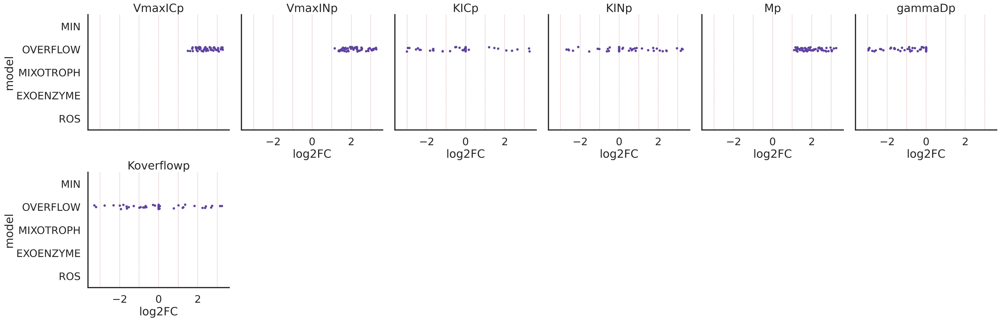

In [53]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['fit'].isin(['good']) & ~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='model', hue_order=morder, palette=mpalette, 
    legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [54]:
mparams_df.loc[mparams_df.variable.isin(['Koverflowp'])]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC
6,OVERFLOW,monte_ponly_fix_OVERFLOW_80_monte__73_OVERFLOW,9.776044,84.824891,28.796734,1.0,good,Koverflowp,1.025780e-05,0.000001,3.147752
18,OVERFLOW,monte_ponly_fix_OVERFLOW_67_monte__20_OVERFLOW,8.936707,108.746890,31.174334,2.0,good,Koverflowp,6.997286e-07,0.000001,-0.726029
30,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__5_OVERFLOW,10.596184,94.520130,31.647318,3.0,good,Koverflowp,7.480150e-07,0.000001,-0.629758
42,OVERFLOW,monte_ponly_fix_OVERFLOW_83_monte__63_OVERFLOW,9.028391,113.961018,32.076232,4.0,good,Koverflowp,1.015765e-06,0.000001,-0.188330
54,OVERFLOW,monte_ponly_fix_OVERFLOW_91_monte__13_OVERFLOW,9.062687,115.735800,32.386376,5.0,good,Koverflowp,4.137768e-06,0.000001,1.837956
...,...,...,...,...,...,...,...,...,...,...,...
119406,OVERFLOW,monte_ponly_fix_OVERFLOW_80_monte__24_OVERFLOW,182.411241,1446.131713,513.605569,9951.0,bad,Koverflowp,1.157407e-06,0.000001,0.000000
119418,OVERFLOW,monte_ponly_fix_OVERFLOW_79_monte__3_OVERFLOW,185.233451,1447.413863,517.792879,9952.0,bad,Koverflowp,3.048143e-07,0.000001,-1.924894
119430,OVERFLOW,monte_ponly_fix_OVERFLOW_10_monte__2_OVERFLOW,181.382474,1491.767426,520.173496,9953.0,bad,Koverflowp,2.382248e-07,0.000001,-2.280501
119442,OVERFLOW,monte_ponly_fix_OVERFLOW_100_monte__36_OVERFLOW,181.950932,1497.427353,521.975385,9954.0,bad,Koverflowp,2.390761e-07,0.000001,-2.275355


In [55]:
mparams_df.fit.value_counts()

bad     118800
good       660
Name: fit, dtype: int64

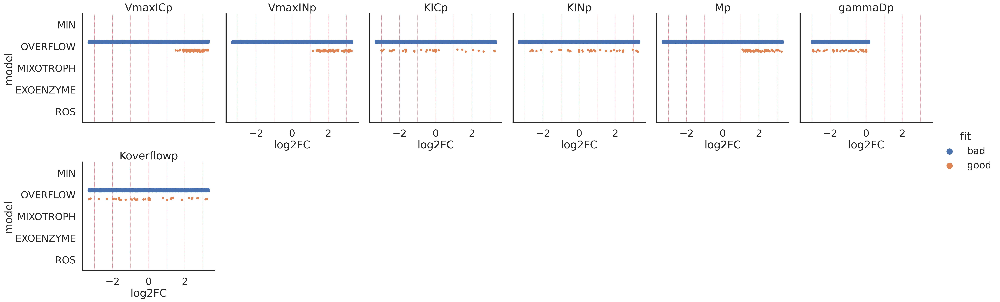

In [56]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='fit', hue_order=['bad','good', ], #morder, palette=mpalette, 
    dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [57]:
variables_to_show_log = ['gammaDp', 'KINp', 'KICp',
      'Mp_day',  'VmaxINp_day_cell', 'VmaxICp_day_cell',
       'gamma_DON2DINp_day_cell', 'KONp', 'KOCp', 'VmaxONp', 'VmaxOCp',
       'VmaxOCp_day_cell', 'VmaxONp_day_cell', 'omegaP',
       'E_ROSp_day']

variables_to_show_nolog = ['Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip',]


In [58]:
    min_params_to_update, _, _ = get_param_tuning_values('MIN', organism_to_tune)


In [59]:
from scipy.stats import pearsonr

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

In [60]:
def _get_corrs(model):
    mrows = min_rows 
    cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

    tmp = mparams_df.loc[
                    mparams_df.idx.isin(mrows.idx) &
                    mparams_df.model.isin([model]) 
                ]

    mtmp = tmp.pivot_table(index='idx', columns='variable', values='FC')[cur_params_to_update]
    corr_df = mtmp.corr()
    trimask = np.triu(np.ones_like(corr_df, dtype=bool))    
    corr_unstack = corr_df.mask(trimask).unstack().dropna()
    res_df = corr_unstack.rename_axis(['var1', 'var2']).reset_index().rename(columns={0:'correlation'})
    res_df['model'] = model
    return res_df
corr_df = pd.concat([_get_corrs(m) for m in mparams_df.model.unique() ], ignore_index=True)
corr_df

,var1,var2,correlation,model
0,VmaxICp,VmaxINp,-0.356306,OVERFLOW
1,VmaxICp,KICp,0.007073,OVERFLOW
2,VmaxICp,KINp,0.045698,OVERFLOW
3,VmaxICp,Mp,0.189595,OVERFLOW
4,VmaxICp,gammaDp,0.087854,OVERFLOW
5,VmaxICp,Koverflowp,-0.007977,OVERFLOW
6,VmaxINp,KICp,-0.017555,OVERFLOW
7,VmaxINp,KINp,-0.121698,OVERFLOW
8,VmaxINp,Mp,0.381932,OVERFLOW
9,VmaxINp,gammaDp,-0.030498,OVERFLOW


In [61]:
corr_df['pair'] = corr_df.var1 +' / ' +  corr_df.var2

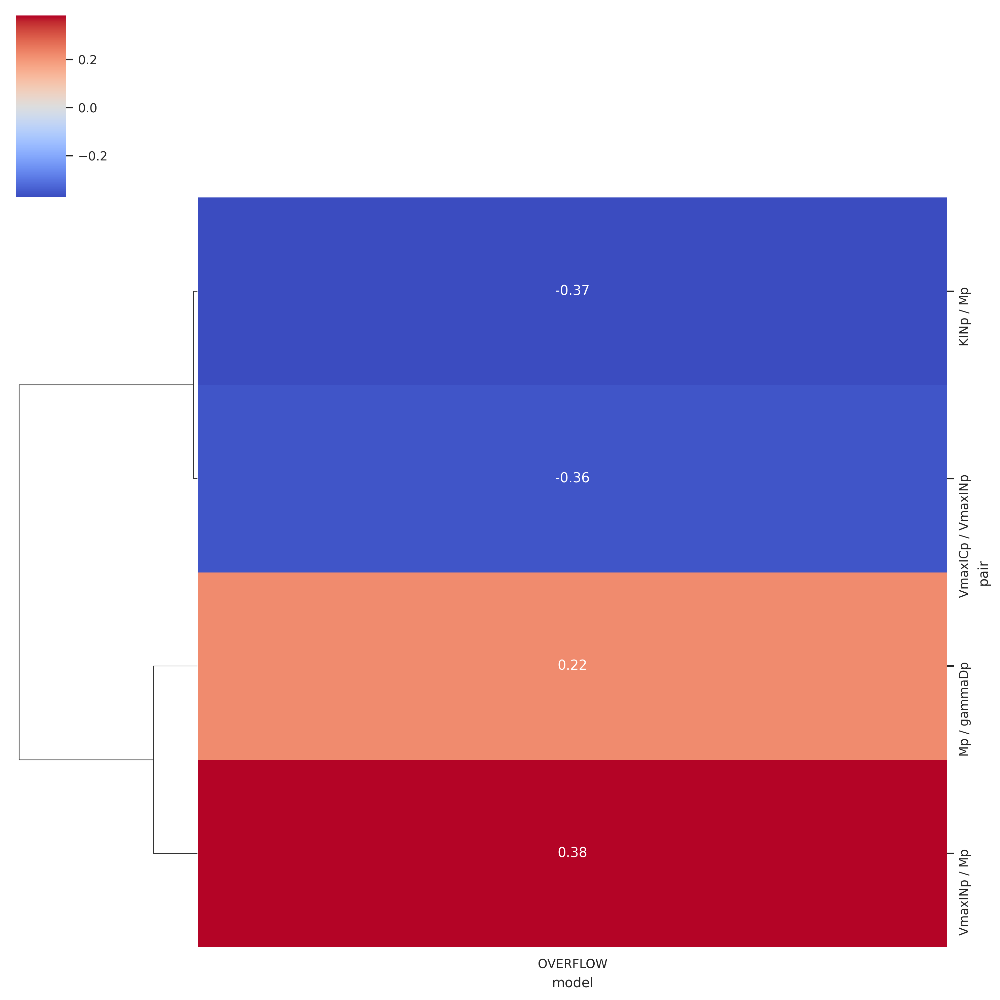

In [62]:
sns.set_context('paper')
corr_df_filtered = corr_df.loc[(corr_df.correlation > 0.2) | (corr_df.correlation < -0.2)]

pcorr_df = corr_df.loc[corr_df.pair.isin(corr_df_filtered.pair)].pivot_table(index='pair', columns=['model',  ], 
                               values='correlation', fill_value=3, dropna=True)
#pcorr_df = pcorr_df.reindex(columns=pcorr_df.columns.reindex(morder, level=0)[0])

g = sns.clustermap(
    pcorr_df, 
    cmap='coolwarm', 
    mask=pcorr_df==3,
    col_cluster=False,
    annot=True,
    figsize=(10,10),
)
ax = g.ax_heatmap  
for i in [2,4,6,8]:
    ax.axvline(i, c='black')


In [63]:
final_idxes = set(min_rows.idx)

In [64]:
selected_params = sum_df.loc[sum_df.idx.isin(final_idxes)]

In [65]:
from scipy.cluster.vq import whiten
from scipy.cluster.hierarchy import fcluster, linkage

#def _get_clusters(model):
#model='MIN'
#cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

cur_params_to_update = ['VmaxICp', 'VmaxINp', 'Mp',]

tmp = mparams_df.loc[
                mparams_df.idx.isin(final_idxes) #&
                #mparams_df.model.isin([model]) 
            ]

mtmp = tmp.pivot_table(index=['model','idx'], columns='variable', values='FC')[cur_params_to_update]


# standardize (normalize) the features
data = whiten(mtmp)

# Compute the distance matrix
matrix = linkage(
    data,
    method='ward',
    #method='average',
    #method='single',
    #method='centroid',
    #method='complete',
    metric='euclidean'
    )

# Assign cluster labels
labels = fcluster(
    matrix, 10, 
    criterion='distance'
    )

# Create DataFrame
#mtmp['labels'] = labels
    
#mtmp = _get_clusters('MIN')
# corr_df = pd.concat([_get_corrs(m,l) for m in morder for l in ('RMSE', 'lRMSE')], ignore_index=True)
# corr_df

In [66]:
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))

In [67]:
mparams_df['cluster'] = mparams_df.idx.map(labels_series)

In [68]:
mparams_df['cluster'].value_counts()

2.0    384
1.0    276
Name: cluster, dtype: int64

In [69]:
mtmp

variable                                                   VmaxICp   VmaxINp  \
model    idx                                                                   
OVERFLOW monte_ponly_fix_OVERFLOW_100_monte__31_OVERFLOW  2.699955  3.129406   
         monte_ponly_fix_OVERFLOW_100_monte__5_OVERFLOW   3.018767  1.656718   
         monte_ponly_fix_OVERFLOW_10_monte__14_OVERFLOW   2.806598  2.272922   
         monte_ponly_fix_OVERFLOW_13_monte__19_OVERFLOW   2.685770  1.829228   
         monte_ponly_fix_OVERFLOW_13_monte__26_OVERFLOW   2.445550  3.136952   
         monte_ponly_fix_OVERFLOW_15_monte__14_OVERFLOW   2.335692  1.541382   
         monte_ponly_fix_OVERFLOW_18_monte__79_OVERFLOW   2.818123  1.707560   
         monte_ponly_fix_OVERFLOW_22_monte__11_OVERFLOW   2.975851  1.405999   
         monte_ponly_fix_OVERFLOW_22_monte__50_OVERFLOW   3.026754  1.475242   
         monte_ponly_fix_OVERFLOW_22_monte__51_OVERFLOW   3.030433  1.157921   
         monte_ponly_fix_OVERFLOW_23_monte__61_OVERFLOW   1.497636  2.877500   
         monte_ponly_fix_OVERFLOW_23_monte__78_OVERFLOW   3.260471  2.523849   
         monte_ponly_fix_OVERFLOW_25_monte__66_OVERFLOW   3.185199  1.354628   
         monte_ponly_fix_OVERFLOW_28_monte__18_OVERFLOW   2.736075  2.102486   
         monte_ponly_fix_OVERFLOW_30_monte__45_OVERFLOW   2.534761  1.382711   
         monte_ponly_fix_OVERFLOW_31_monte__17_OVERFLOW   1.749550  2.945901   
         monte_ponly_fix_OVERFLOW_32_monte__57_OVERFLOW   2.071538  2.246197   
         monte_ponly_fix_OVERFLOW_33_monte__12_OVERFLOW   2.877418  2.889480   
         monte_ponly_fix_OVERFLOW_34_monte__47_OVERFLOW   3.035186  1.860993   
         monte_ponly_fix_OVERFLOW_35_monte__55_OVERFLOW   2.400082  2.540670   
         monte_ponly_fix_OVERFLOW_36_monte__37_OVERFLOW   2.841245  3.144180   
         monte_ponly_fix_OVERFLOW_36_monte__92_OVERFLOW   2.369100  2.135788   
         monte_ponly_fix_OVERFLOW_38_monte__60_OVERFLOW   1.991403  2.867727   
         monte_ponly_fix_OVERFLOW_44_monte__85_OVERFLOW   2.401257  1.943908   
         monte_ponly_fix_OVERFLOW_45_monte__88_OVERFLOW   2.636000  3.215302   
         monte_ponly_fix_OVERFLOW_46_monte__28_OVERFLOW   2.203372  2.427299   
         monte_ponly_fix_OVERFLOW_46_monte__77_OVERFLOW   2.436268  2.296679   
         monte_ponly_fix_OVERFLOW_47_monte__15_OVERFLOW   3.268584  1.838495   
         monte_ponly_fix_OVERFLOW_48_monte__26_OVERFLOW   1.945215  2.389252   
         monte_ponly_fix_OVERFLOW_52_monte__23_OVERFLOW   2.970914  2.126630   
         monte_ponly_fix_OVERFLOW_54_monte__86_OVERFLOW   2.142812  3.270628   
         monte_ponly_fix_OVERFLOW_58_monte__32_OVERFLOW   2.322209  1.642157   
         monte_ponly_fix_OVERFLOW_60_monte__29_OVERFLOW   1.730903  1.987681   
         monte_ponly_fix_OVERFLOW_60_monte__61_OVERFLOW   1.939141  3.069954   
         monte_ponly_fix_OVERFLOW_64_monte__87_OVERFLOW   1.739922  2.281169   
         monte_ponly_fix_OVERFLOW_65_monte__24_OVERFLOW   1.922345  2.322693   
         monte_ponly_fix_OVERFLOW_65_monte__37_OVERFLOW   3.048228  2.544032   
         monte_ponly_fix_OVERFLOW_66_monte__64_OVERFLOW   2.104406  3.029279   
         monte_ponly_fix_OVERFLOW_66_monte__72_OVERFLOW   2.934546  3.286167   
         monte_ponly_fix_OVERFLOW_67_monte__20_OVERFLOW   2.288846  1.762018   
         monte_ponly_fix_OVERFLOW_68_monte__32_OVERFLOW   2.093532  1.591311   
         monte_ponly_fix_OVERFLOW_69_monte__81_OVERFLOW   1.717810  2.501898   
         monte_ponly_fix_OVERFLOW_75_monte__28_OVERFLOW   2.615357  1.499826   
         monte_ponly_fix_OVERFLOW_79_monte__41_OVERFLOW   2.057413  2.300133   
         monte_ponly_fix_OVERFLOW_79_monte__60_OVERFLOW   2.670231  2.118149   
         monte_ponly_fix_OVERFLOW_80_monte__73_OVERFLOW   3.084939  1.649696   
         monte_ponly_fix_OVERFLOW_83_monte__45_OVERFLOW   2.659610  1.548983   
         monte_ponly_fix_OVERFLOW_83_monte__53_OVERFLOW   1.611091  2.249282   


kmeans.labels_

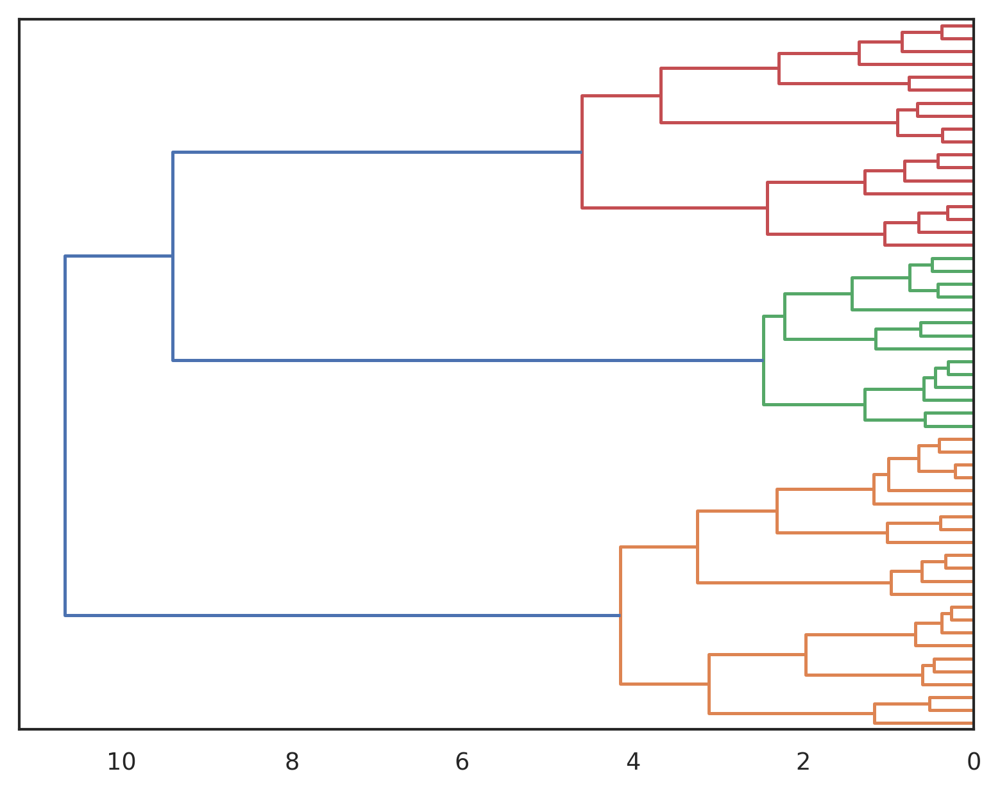

In [70]:
from scipy.cluster.hierarchy import dendrogram

dendrogram(matrix, no_labels=True, orientation='left')
plt.show()

In [71]:
lut = dict(zip(np.unique(labels), sns.color_palette('Set2', n_colors=np.max(labels)+1).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


In [72]:
mtmp

variable                                                   VmaxICp   VmaxINp  \
model    idx                                                                   
OVERFLOW monte_ponly_fix_OVERFLOW_100_monte__31_OVERFLOW  2.699955  3.129406   
         monte_ponly_fix_OVERFLOW_100_monte__5_OVERFLOW   3.018767  1.656718   
         monte_ponly_fix_OVERFLOW_10_monte__14_OVERFLOW   2.806598  2.272922   
         monte_ponly_fix_OVERFLOW_13_monte__19_OVERFLOW   2.685770  1.829228   
         monte_ponly_fix_OVERFLOW_13_monte__26_OVERFLOW   2.445550  3.136952   
         monte_ponly_fix_OVERFLOW_15_monte__14_OVERFLOW   2.335692  1.541382   
         monte_ponly_fix_OVERFLOW_18_monte__79_OVERFLOW   2.818123  1.707560   
         monte_ponly_fix_OVERFLOW_22_monte__11_OVERFLOW   2.975851  1.405999   
         monte_ponly_fix_OVERFLOW_22_monte__50_OVERFLOW   3.026754  1.475242   
         monte_ponly_fix_OVERFLOW_22_monte__51_OVERFLOW   3.030433  1.157921   
         monte_ponly_fix_OVERFLOW_23_monte__61_OVERFLOW   1.497636  2.877500   
         monte_ponly_fix_OVERFLOW_23_monte__78_OVERFLOW   3.260471  2.523849   
         monte_ponly_fix_OVERFLOW_25_monte__66_OVERFLOW   3.185199  1.354628   
         monte_ponly_fix_OVERFLOW_28_monte__18_OVERFLOW   2.736075  2.102486   
         monte_ponly_fix_OVERFLOW_30_monte__45_OVERFLOW   2.534761  1.382711   
         monte_ponly_fix_OVERFLOW_31_monte__17_OVERFLOW   1.749550  2.945901   
         monte_ponly_fix_OVERFLOW_32_monte__57_OVERFLOW   2.071538  2.246197   
         monte_ponly_fix_OVERFLOW_33_monte__12_OVERFLOW   2.877418  2.889480   
         monte_ponly_fix_OVERFLOW_34_monte__47_OVERFLOW   3.035186  1.860993   
         monte_ponly_fix_OVERFLOW_35_monte__55_OVERFLOW   2.400082  2.540670   
         monte_ponly_fix_OVERFLOW_36_monte__37_OVERFLOW   2.841245  3.144180   
         monte_ponly_fix_OVERFLOW_36_monte__92_OVERFLOW   2.369100  2.135788   
         monte_ponly_fix_OVERFLOW_38_monte__60_OVERFLOW   1.991403  2.867727   
         monte_ponly_fix_OVERFLOW_44_monte__85_OVERFLOW   2.401257  1.943908   
         monte_ponly_fix_OVERFLOW_45_monte__88_OVERFLOW   2.636000  3.215302   
         monte_ponly_fix_OVERFLOW_46_monte__28_OVERFLOW   2.203372  2.427299   
         monte_ponly_fix_OVERFLOW_46_monte__77_OVERFLOW   2.436268  2.296679   
         monte_ponly_fix_OVERFLOW_47_monte__15_OVERFLOW   3.268584  1.838495   
         monte_ponly_fix_OVERFLOW_48_monte__26_OVERFLOW   1.945215  2.389252   
         monte_ponly_fix_OVERFLOW_52_monte__23_OVERFLOW   2.970914  2.126630   
         monte_ponly_fix_OVERFLOW_54_monte__86_OVERFLOW   2.142812  3.270628   
         monte_ponly_fix_OVERFLOW_58_monte__32_OVERFLOW   2.322209  1.642157   
         monte_ponly_fix_OVERFLOW_60_monte__29_OVERFLOW   1.730903  1.987681   
         monte_ponly_fix_OVERFLOW_60_monte__61_OVERFLOW   1.939141  3.069954   
         monte_ponly_fix_OVERFLOW_64_monte__87_OVERFLOW   1.739922  2.281169   
         monte_ponly_fix_OVERFLOW_65_monte__24_OVERFLOW   1.922345  2.322693   
         monte_ponly_fix_OVERFLOW_65_monte__37_OVERFLOW   3.048228  2.544032   
         monte_ponly_fix_OVERFLOW_66_monte__64_OVERFLOW   2.104406  3.029279   
         monte_ponly_fix_OVERFLOW_66_monte__72_OVERFLOW   2.934546  3.286167   
         monte_ponly_fix_OVERFLOW_67_monte__20_OVERFLOW   2.288846  1.762018   
         monte_ponly_fix_OVERFLOW_68_monte__32_OVERFLOW   2.093532  1.591311   
         monte_ponly_fix_OVERFLOW_69_monte__81_OVERFLOW   1.717810  2.501898   
         monte_ponly_fix_OVERFLOW_75_monte__28_OVERFLOW   2.615357  1.499826   
         monte_ponly_fix_OVERFLOW_79_monte__41_OVERFLOW   2.057413  2.300133   
         monte_ponly_fix_OVERFLOW_79_monte__60_OVERFLOW   2.670231  2.118149   
         monte_ponly_fix_OVERFLOW_80_monte__73_OVERFLOW   3.084939  1.649696   
         monte_ponly_fix_OVERFLOW_83_monte__45_OVERFLOW   2.659610  1.548983   
         monte_ponly_fix_OVERFLOW_83_monte__53_OVERFLOW   1.611091  2.249282   


In [73]:
mtmp.min()

variable
VmaxICp    1.497636
VmaxINp    1.157921
Mp         1.099488
dtype: float64

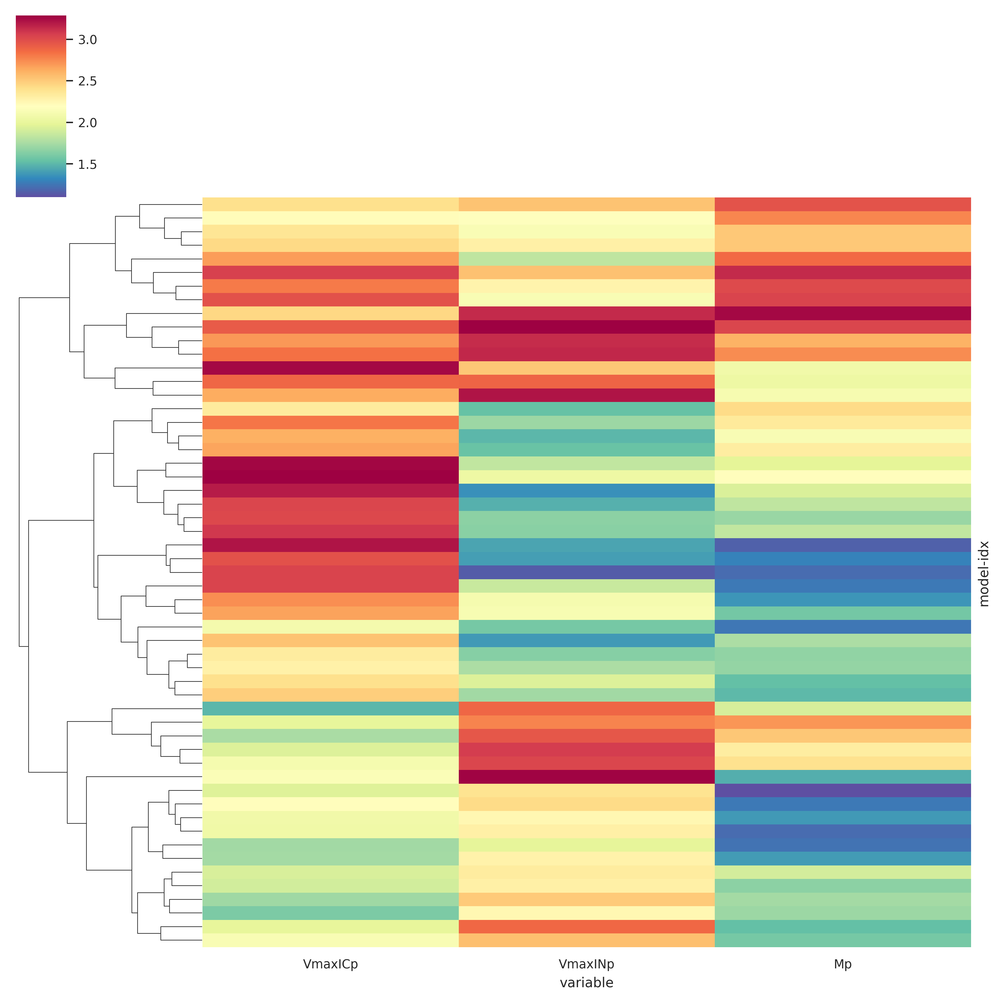

In [74]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, #row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    #row_colors=row_colors,
    yticklabels=False,
              )

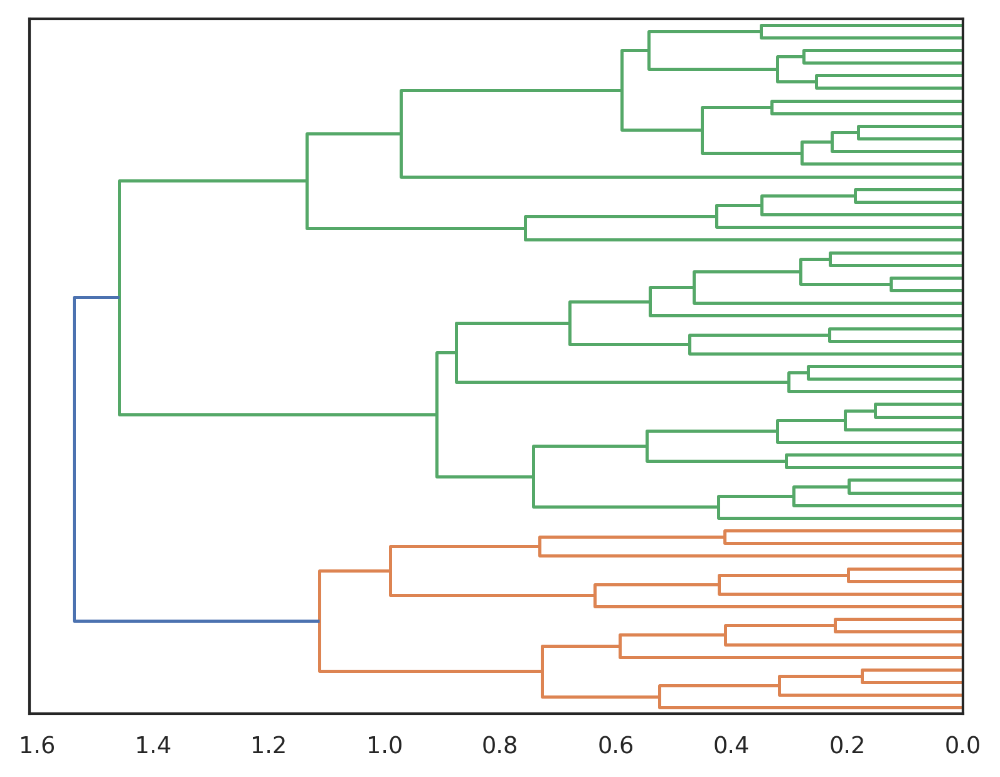

In [75]:
import scipy
matrix=cg.dendrogram_row.linkage
den = dendrogram(
    matrix, no_labels=True, orientation='left', 
    labels = mtmp.index.get_level_values(1),
    color_threshold=1.5           
          )
plt.show()
# scipy.cluster.hierarchy.dendrogram(g.dendrogram_row.linkage,
#                                          labels = mtmp.index,
#                                   #       color_threshold=0.60
#                                   )  

In [76]:
cluster_ids = pd.DataFrame(data={'labels': den['leaves_color_list']}, index=den['ivl'], )

In [77]:
mtmp1 = mtmp.copy()
mtmp1['labels'] = mtmp1.index.get_level_values(1).map(cluster_ids['labels']) 
mtmp1.reset_index(inplace=True)

In [78]:
labels=mtmp.index.get_level_values(1).map(cluster_ids['labels']) 
labels.index= mtmp.index.get_level_values(1)

In [79]:
cluster_ids.labels.value_counts()

C2    40
C1    15
Name: labels, dtype: int64

In [80]:
mtmp1.labels.value_counts()

C2    40
C1    15
Name: labels, dtype: int64

In [81]:
mparams_df['cluster'] = mparams_df.idx.map(cluster_ids['labels']) 

In [82]:
corder=['C1', 'C2', 'C3', ]

In [83]:
lut = dict(zip(corder+['C0'], sns.color_palette('Set2', n_colors=cluster_ids.labels.nunique()).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


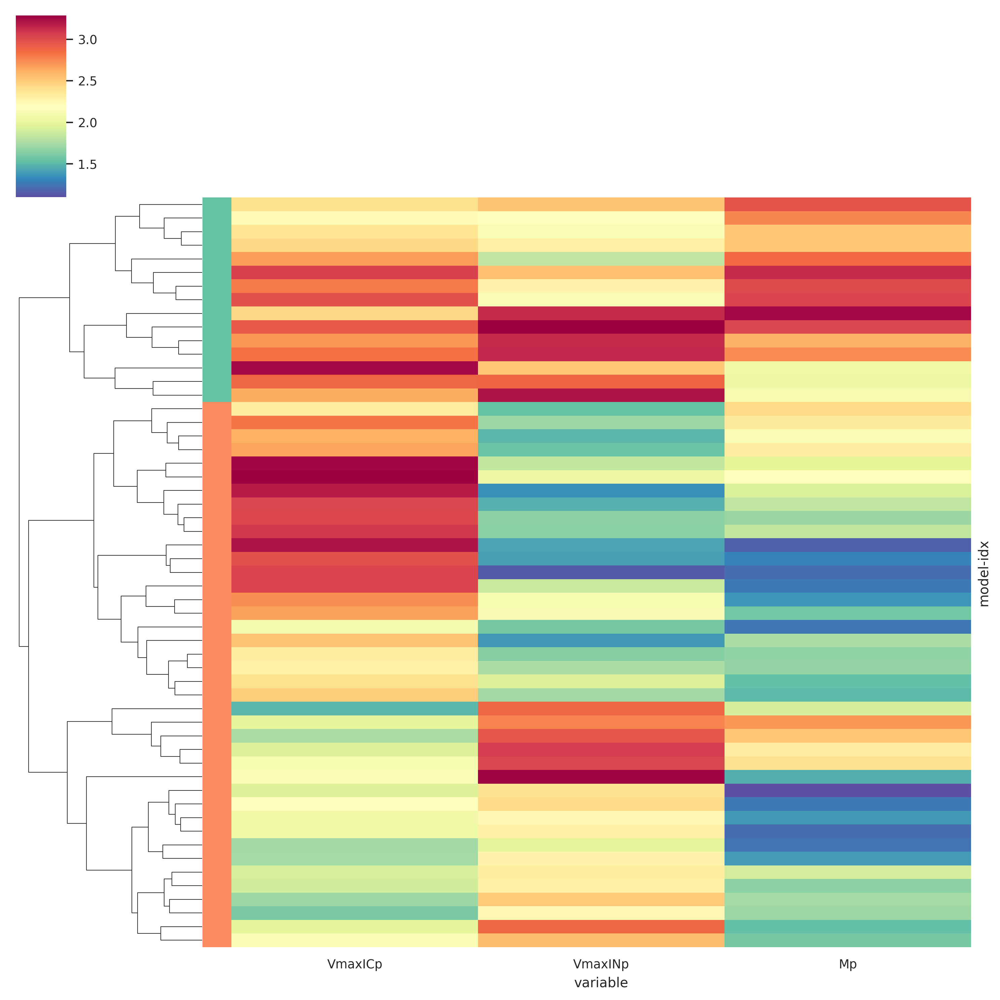

In [84]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    row_colors=row_colors,
    yticklabels=False,
              )

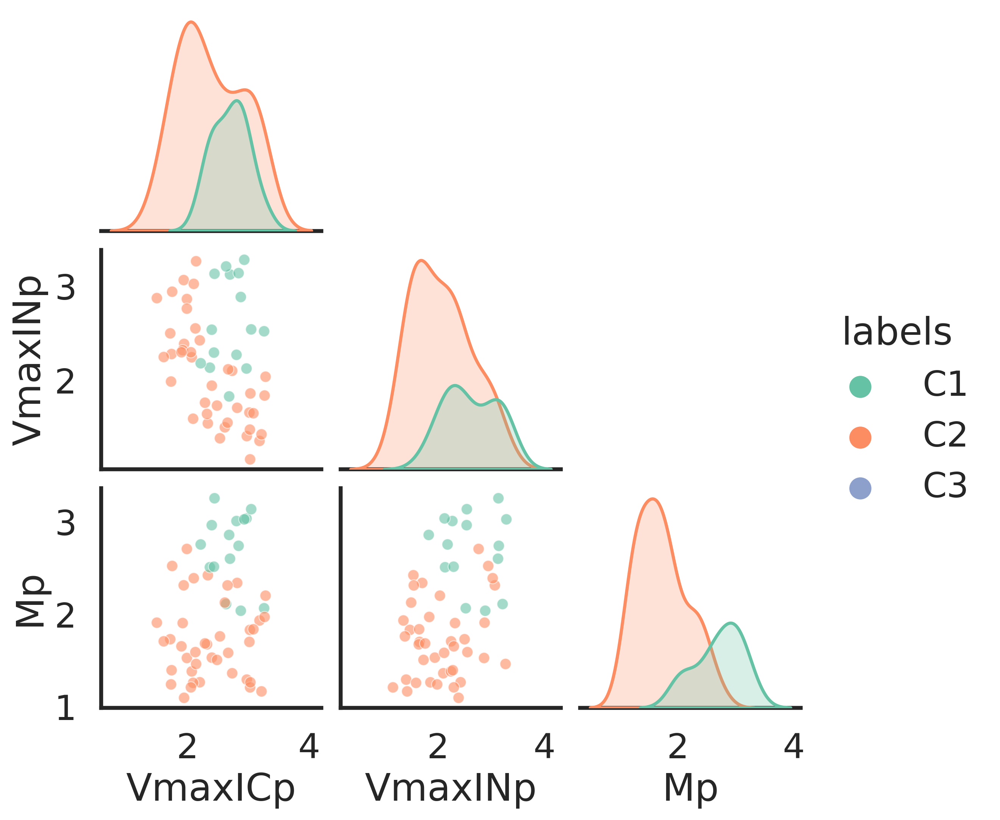

In [85]:
sns.set_context('poster')
g = sns.pairplot(
    data=mtmp1, hue='labels', palette='Set2', hue_order=corder, corner=True,
    #plot_kws=dict(marker="+", linewidth=2, alpha=0.5),
    plot_kws=dict(alpha=0.6, s=50),
)
#g.map_lower(sns.kdeplot, levels=1)


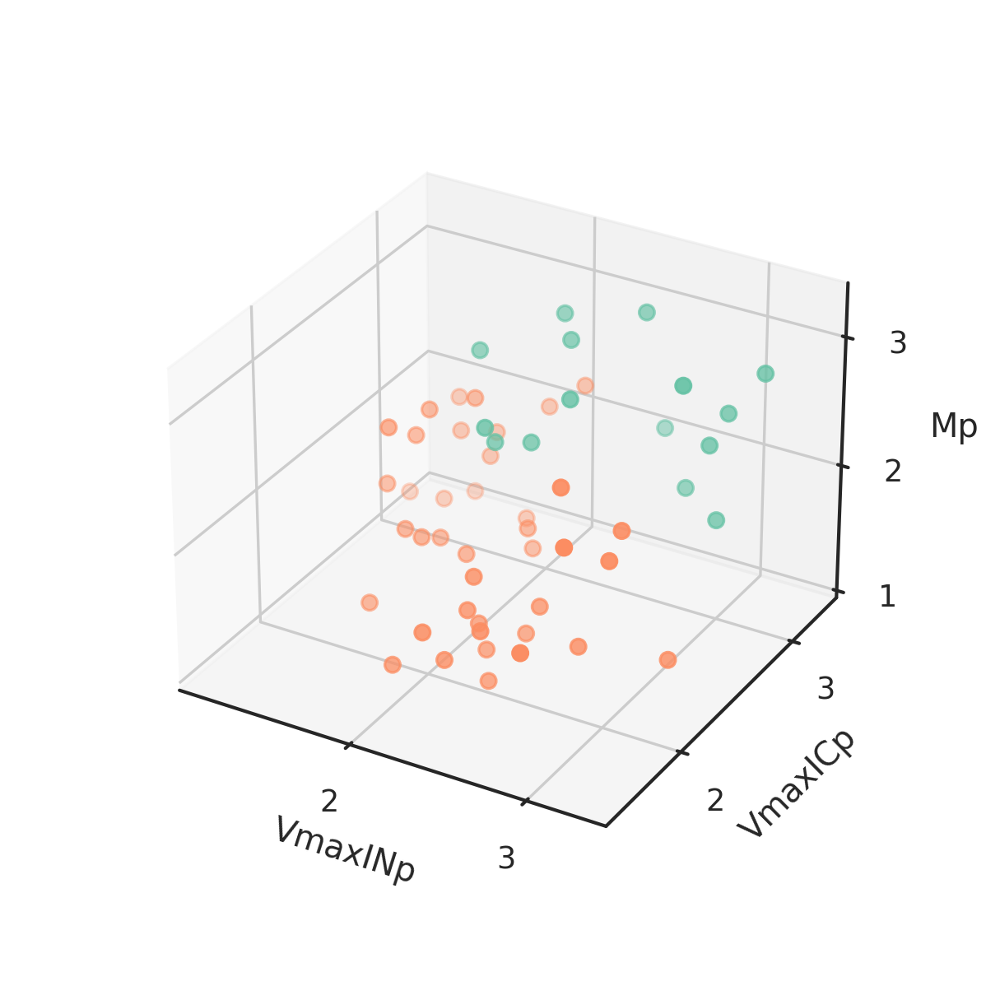

In [86]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
sns.set_context('paper')
# g = sns.pairplot(
#     data=mtmp1, hue='labels', palette='Set2', hue_order=corder,


fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection = '3d')
#ax = fig.add_subplot(111, projection = '3d', )

ax.set_ylabel("VmaxICp")
ax.set_xlabel("VmaxINp")
ax.set_zlabel("Mp")
ax.set_xticks([1,2,3])
ax.set_yticks([1,2,3])
ax.set_zticks([1,2,3])
ax.scatter3D(
    data=mtmp1,
    ys = 'VmaxICp',
    xs = 'VmaxINp',
    zs = 'Mp',
    c = np.vectorize(lut.get)(mtmp1.labels) 
    
)
ax.set_box_aspect(aspect=None, zoom=0.8)
plt.show()

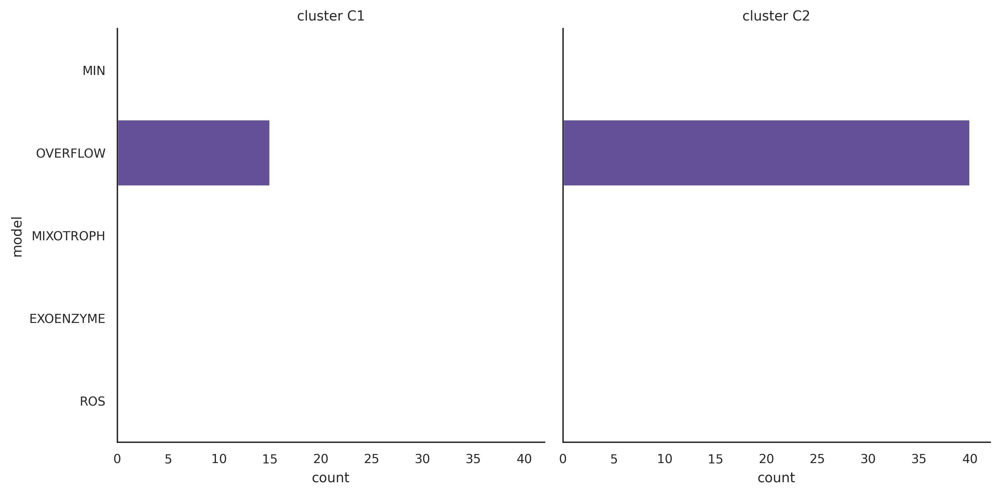

In [87]:
sns.catplot(
    data=mtmp1,
    col='labels', 
    y='model', hue='model', hue_order=morder, order=morder, palette=mpalette,dodge=False,
    kind='count',
    legend=False,
).set_titles(col_template='cluster {col_name}', row_template='{row_name}')

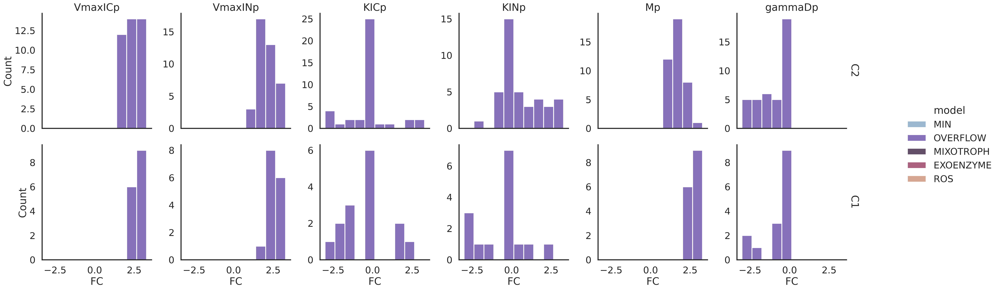

In [88]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & mparams_df.variable.isin(min_params_to_update)], 
    col='variable', row='cluster', x='FC',  #col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [89]:
mtmp.columns

Index(['VmaxICp', 'VmaxINp', 'Mp'], dtype='object', name='variable')

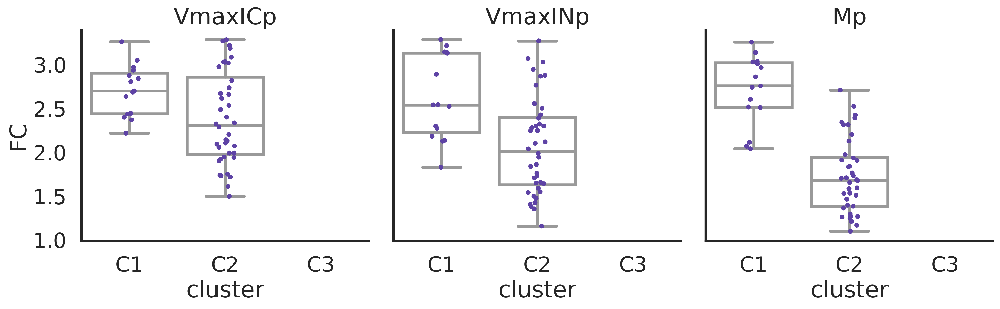

In [90]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', #fill=None,#hue='cluster', #col_wrap=3,
    #hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
    kind='box', dodge=False, col_wrap=3,color='white', order=corder,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.map_dataframe(sns.stripplot, y='FC', x='cluster', order=corder,
    hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
     )


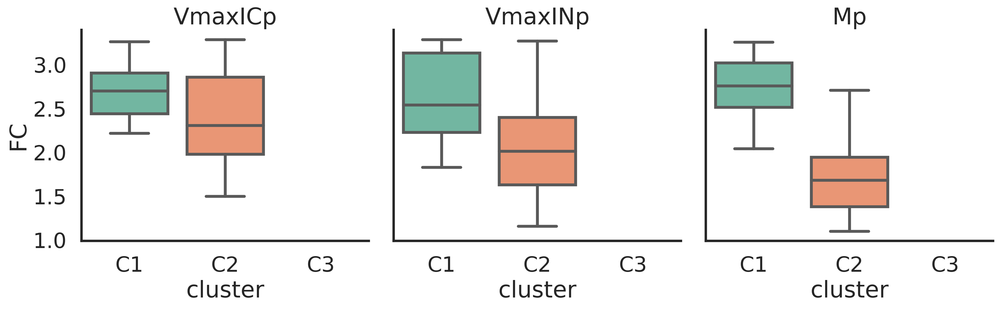

In [91]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [92]:
corder1 = ['C0', 'C1', 'C2', 'C3', 'C4']

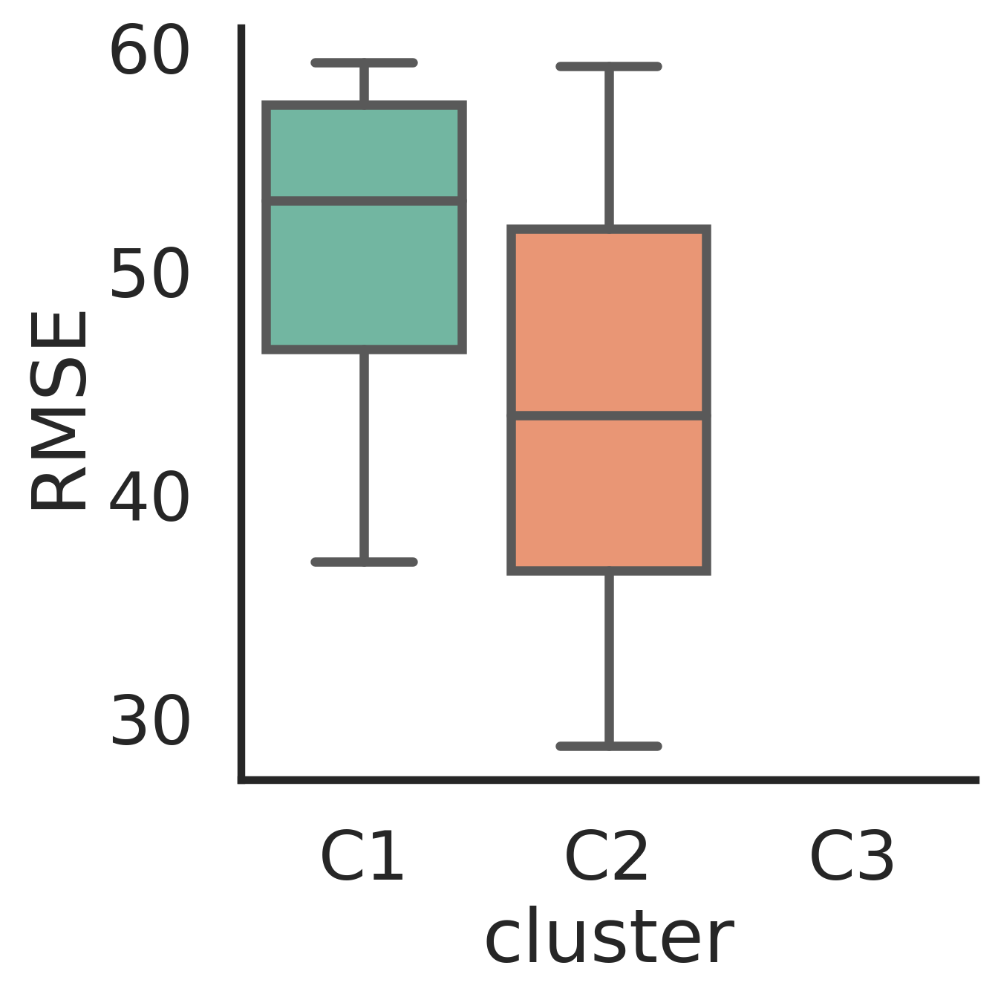

In [93]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder1) ], 
     y='RMSE', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [94]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Koverflowp', 'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp',
       'Vmax/Vmax Ip'], dtype=object)

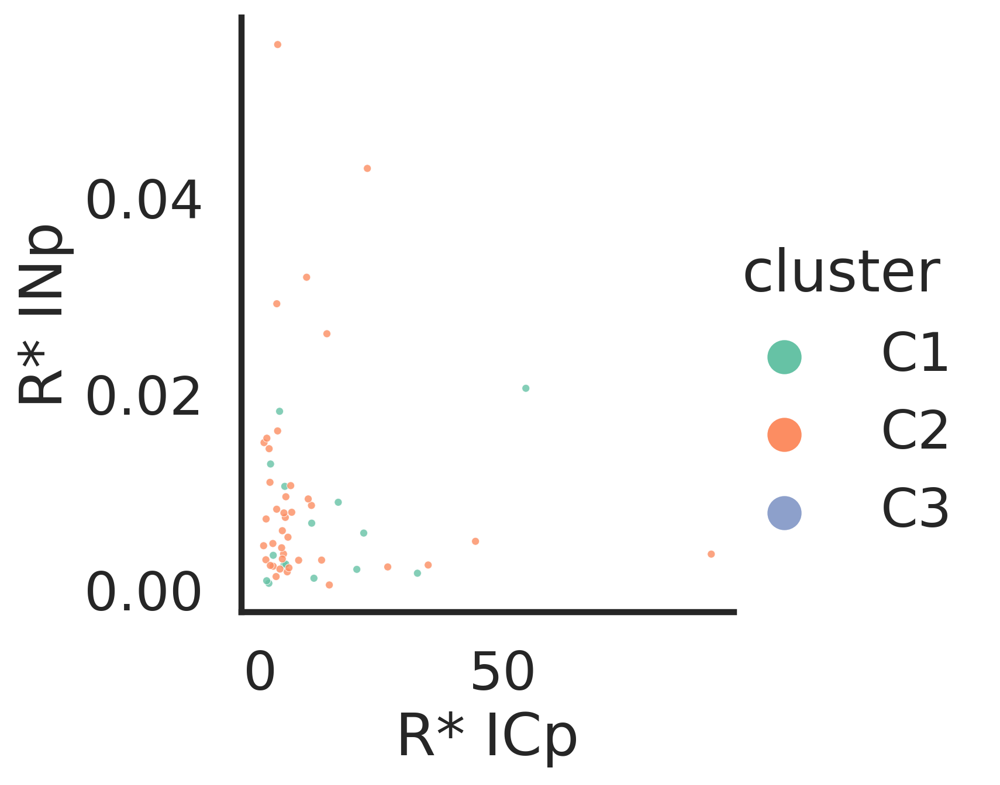

In [95]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='cluster',hue_order=corder, palette='Set2',
    
)


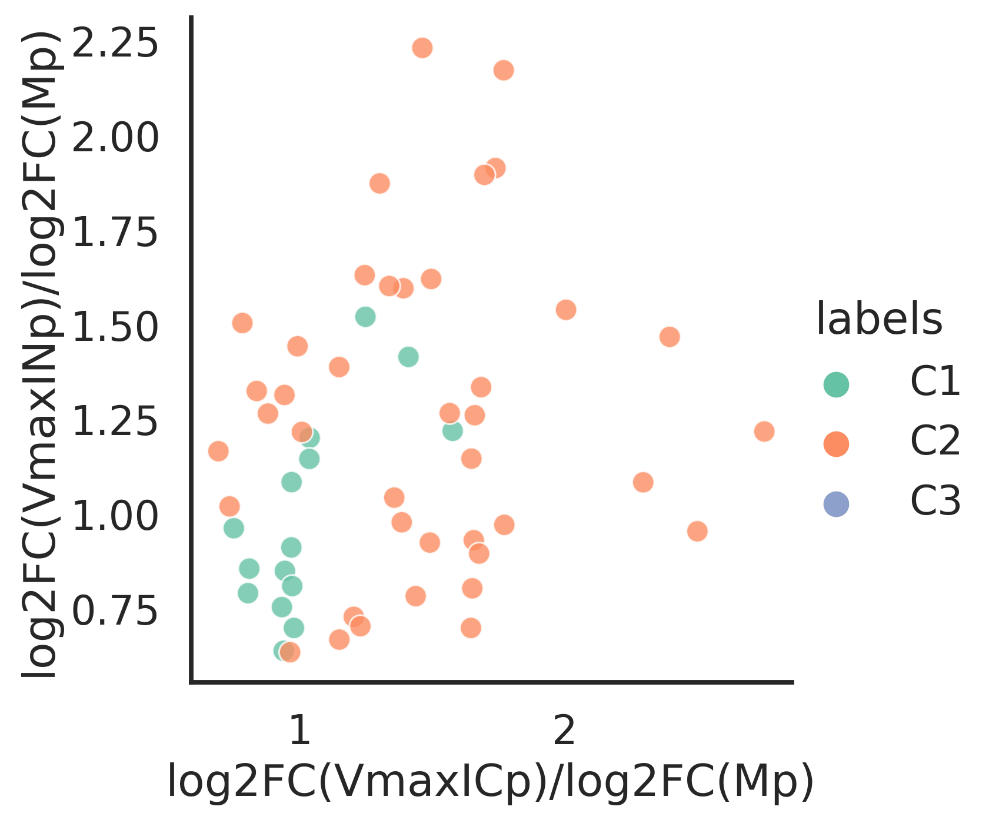

In [96]:
mtmp1['log2FC(VmaxINp)/log2FC(Mp)'] = mtmp1.VmaxINp / mtmp1.Mp
mtmp1['log2FC(VmaxICp)/log2FC(Mp)'] = mtmp1.VmaxICp / mtmp1.Mp
sns.set_context('talk')
g = sns.relplot(
    data=mtmp1,
    y='log2FC(VmaxINp)/log2FC(Mp)', x='log2FC(VmaxICp)/log2FC(Mp)', #s=10, 
    alpha=0.8,
    hue='labels',hue_order=corder, palette='Set2',
    #hue='model',hue_order=morder, palette=mpalette,
    
)


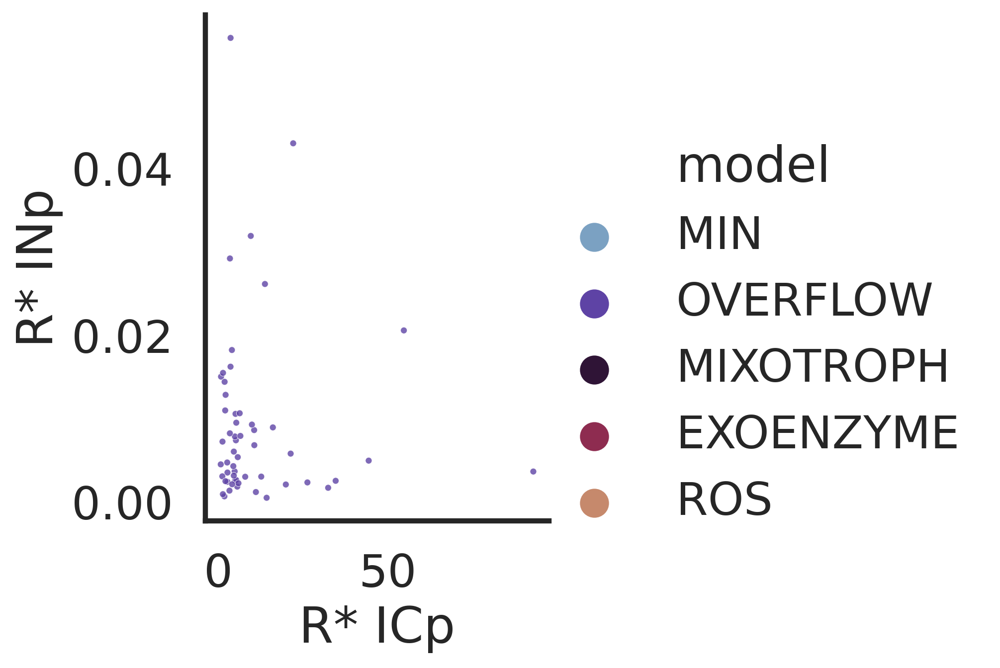

In [97]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='model',hue_order=morder, palette=mpalette,
    
)


In [98]:
bestdf = df.loc[df.idx.isin(mtmp1.idx)]

In [99]:
bestdf = pd.merge(bestdf, mtmp1, on=['model', 'idx'])
bestdf.head()

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,media,which,model,hash,VmaxICp,VmaxINp,Mp,labels,log2FC(VmaxINp)/log2FC(Mp),log2FC(VmaxICp)/log2FC(Mp)
0,0.892857,0.000000,0.000000,3.000000,0.000000,100.000000,19.875000,0.000000,2241.552301,0.2,...,lowN,ponly,OVERFLOW,h6878164821315599434,2.3691,2.135788,2.510635,C1,0.850696,0.943626
1,1.092663,0.396045,2.293527,3.069501,0.661020,98.673628,20.364512,4.254166,2233.626705,0.2,...,lowN,ponly,OVERFLOW,h6878164821315599434,2.3691,2.135788,2.510635,C1,0.850696,0.943626
2,1.673854,0.611281,3.539094,3.181089,1.689518,96.737115,21.122146,10.838468,2222.676352,0.2,...,lowN,ponly,OVERFLOW,h6878164821315599434,2.3691,2.135788,2.510635,C1,0.850696,0.943626
3,2.107363,0.769648,4.455738,3.265381,2.454696,95.295770,21.685773,15.736741,2214.815068,0.2,...,lowN,ponly,OVERFLOW,h6878164821315599434,2.3691,2.135788,2.510635,C1,0.850696,0.943626
4,3.137529,1.145943,6.633439,3.467864,4.273203,91.868318,23.025251,27.377630,2196.570171,0.2,...,lowN,ponly,OVERFLOW,h6878164821315599434,2.3691,2.135788,2.510635,C1,0.850696,0.943626


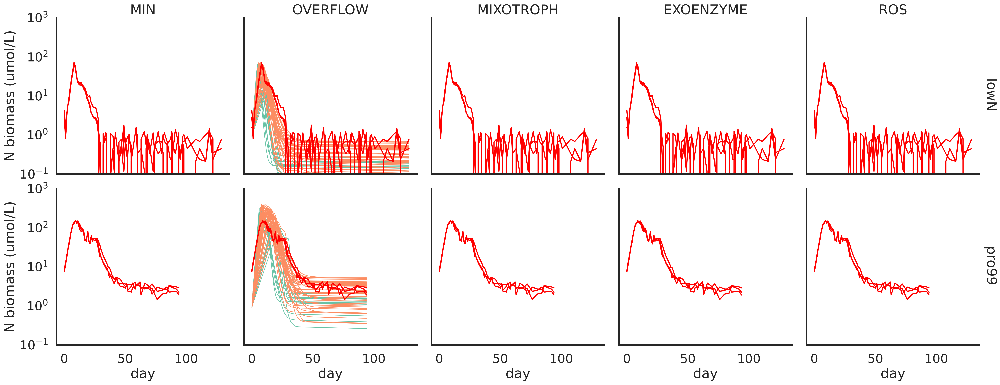

In [100]:
for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

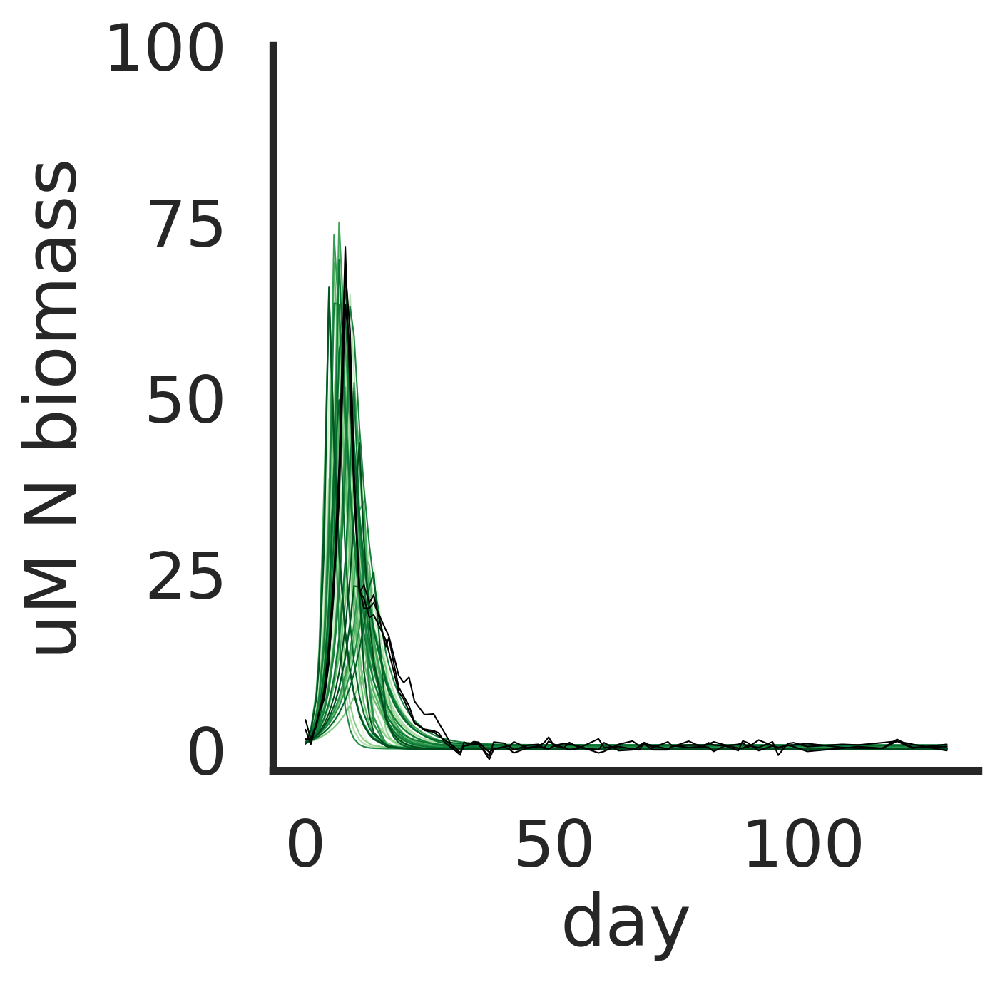

In [101]:

import matplotlib.colors as colors

curdf = bestdf
curdf = bestdf.loc[#bestdf.model.isin(['MIN']) & 
                   bestdf.media.isin(['lowN']) ]


g = sns.relplot(
    data=curdf, x='day', y='Bptotal[N]',
    units='run_id', estimator=None,
     kind='line', #hue_norm=colors.LogNorm(),
     lw=0.5, legend=False, palette='Greens',
    hue='run_id',
    facet_kws=dict(sharey=False),
)
    
datadf = refdf 
sns.lineplot(data=datadf, x='day', y='ref_Bp[N]',
units='Sample', estimator=None,  lw=0.5, color='black',

             legend=False
            )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(ylabel='uM N biomass')
plt.ylim((-3,100))
#plt.suptitle(f'doubled VmaxICp', y=1.05)
plt.show()


In [102]:
corder2 = ['C1', 'C2', 'C3', 'C4', 'C0',]

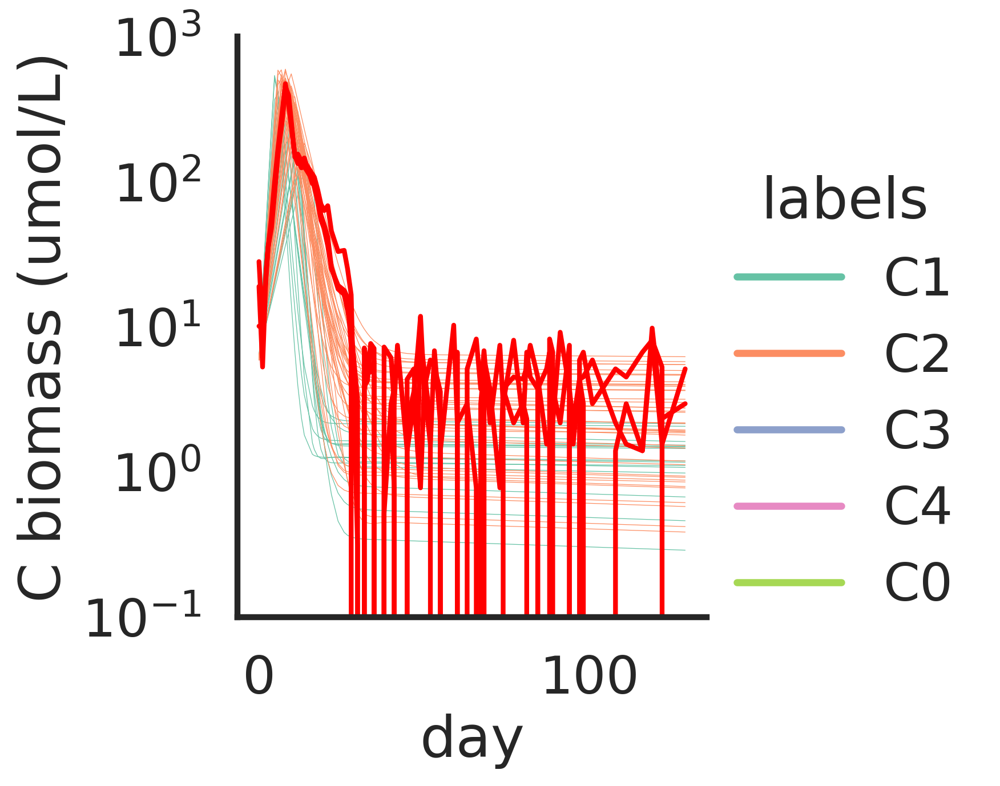

In [103]:
for n in ('C',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin(['lowN'])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        #row='media', row_order=media_order, 
        lw=0.3,
        hue='labels', hue_order=corder2, palette='Set2',
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        #legend=False
    )
    #for row_val, ax in g.axes_dict.items():
    datadf = refdf #if row_val == 'lowN' else refp99df
    sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
    units='Sample', estimator=None, lw=2, color='red',

                 legend=False
                )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [104]:
bestdf.columns

Index(['Bp', 'Np', 'Cp', 'DON', 'RDON', 'DIN', 'DOC', 'RDOC', 'DIC', 'ROS',
       't', 'day', 'gross_uptakeINp', 'gross_uptakeONp', 'gross_uptakeICp',
       'gross_uptakeOCp', 'uptakeNp', 'uptakeCp', 'QCp', 'biosynthesisNp',
       'respirationCp', 'biomass_breakdownCp', 'overflowNp', 'overflowCp',
       'ROSproductionp', 'ROSlossp', 'deathbiomassNp', 'deathstoreNp',
       'deathstoreCp', 'DON2DIN_exop', 'DON2DIN', 'additionalLossRatep',
       'regNp', 'regCp', 'deathC_DOCp', 'deathN_DONp', 'Bp[C]', 'Bptotal[N]',
       'Bptotal[C]', 'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash',
       'VmaxICp', 'VmaxINp', 'Mp', 'labels', 'log2FC(VmaxINp)/log2FC(Mp)',
       'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object')

In [105]:
bestdf['Np/Bp'] = bestdf['Np'] / bestdf['Bp']
bestdf['Cp/Bp'] = bestdf['Cp'] / bestdf['Bp[C]']


In [106]:
df

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,Bp[C],Bptotal[N],Bptotal[C],run_id,idx,id,media,which,model,hash
0,0.892857,0.000000,0.000000,3.000000,0.000000,100.000000,19.875000,0.000000,2241.552301,0.2,...,5.915179,0.892857,5.915179,monte_ponly_fix_OVERFLOW_75_monte__55_lowN_pon...,monte_ponly_fix_OVERFLOW_75_monte__55_OVERFLOW,monte_ponly_fix_OVERFLOW_75_monte__55,lowN,ponly,OVERFLOW,h6878164821315599434
1,0.867553,0.174501,0.222474,3.038351,0.060657,99.751796,20.147014,0.367612,2240.892538,0.2,...,5.747537,1.042054,5.970011,monte_ponly_fix_OVERFLOW_75_monte__55_lowN_pon...,monte_ponly_fix_OVERFLOW_75_monte__55_OVERFLOW,monte_ponly_fix_OVERFLOW_75_monte__55,lowN,ponly,OVERFLOW,h6878164821315599434
2,0.899040,0.236654,0.281792,3.081962,0.128549,99.546652,20.427624,0.746840,2240.085411,0.2,...,5.956137,1.135694,6.237930,monte_ponly_fix_OVERFLOW_75_monte__55_lowN_pon...,monte_ponly_fix_OVERFLOW_75_monte__55_OVERFLOW,monte_ponly_fix_OVERFLOW_75_monte__55,lowN,ponly,OVERFLOW,h6878164821315599434
3,0.923363,0.255349,0.299404,3.107035,0.167306,99.439805,20.584367,0.958670,2239.641583,0.2,...,6.117277,1.178711,6.416681,monte_ponly_fix_OVERFLOW_75_monte__55_lowN_pon...,monte_ponly_fix_OVERFLOW_75_monte__55_OVERFLOW,monte_ponly_fix_OVERFLOW_75_monte__55,lowN,ponly,OVERFLOW,h6878164821315599434
4,0.971225,0.278600,0.322764,3.152736,0.237586,99.252710,20.866315,1.339707,2238.880914,0.2,...,6.434367,1.249826,6.757131,monte_ponly_fix_OVERFLOW_75_monte__55_lowN_pon...,monte_ponly_fix_OVERFLOW_75_monte__55_OVERFLOW,monte_ponly_fix_OVERFLOW_75_monte__55,lowN,ponly,OVERFLOW,h6878164821315599434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1314055,0.007108,0.003809,0.000889,3.756661,1.304909,98.820371,27.044553,5.796600,2241.508361,0.2,...,0.047091,0.010917,0.047979,monte_ponly_fix_OVERFLOW_30_monte__53_lowN_pon...,monte_ponly_fix_OVERFLOW_30_monte__53_OVERFLOW,monte_ponly_fix_OVERFLOW_30_monte__53,lowN,ponly,OVERFLOW,h6878164821315599434
1314056,0.005760,0.003086,0.000720,3.722665,1.307066,98.854280,27.056281,5.806083,2241.516686,0.2,...,0.038158,0.008846,0.038878,monte_ponly_fix_OVERFLOW_30_monte__53_lowN_pon...,monte_ponly_fix_OVERFLOW_30_monte__53_OVERFLOW,monte_ponly_fix_OVERFLOW_30_monte__53,lowN,ponly,OVERFLOW,h6878164821315599434
1314057,0.005076,0.002720,0.000635,3.702166,1.308160,98.874735,27.062225,5.810889,2241.520907,0.2,...,0.033631,0.007796,0.034266,monte_ponly_fix_OVERFLOW_30_monte__53_lowN_pon...,monte_ponly_fix_OVERFLOW_30_monte__53_OVERFLOW,monte_ponly_fix_OVERFLOW_30_monte__53,lowN,ponly,OVERFLOW,h6878164821315599434
1314058,0.004465,0.002393,0.000558,3.681307,1.309137,98.895555,27.067540,5.815186,2241.524683,0.2,...,0.029583,0.006858,0.030142,monte_ponly_fix_OVERFLOW_30_monte__53_lowN_pon...,monte_ponly_fix_OVERFLOW_30_monte__53_OVERFLOW,monte_ponly_fix_OVERFLOW_30_monte__53,lowN,ponly,OVERFLOW,h6878164821315599434


In [107]:
def _compute_ratio(x):
    Nstore_col = 'Np'
    Nbiomass_col = 'Bp'
    Cstore_col = 'Cp'
    Cbiomass_col = 'Bp[C]'
    qc_col = 'QCp'
    
    Nratio = x[Nstore_col] / x[Nbiomass_col]
    Cratio = x[Cstore_col] / x[Cbiomass_col]
    
    
    

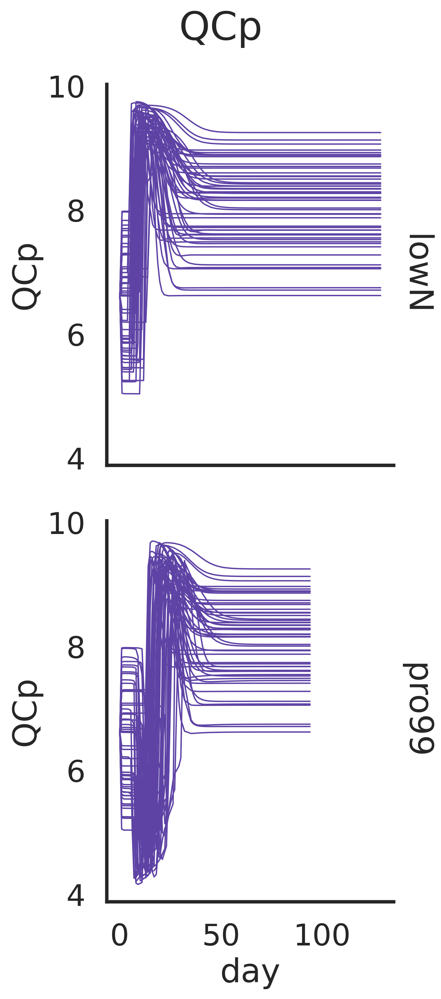

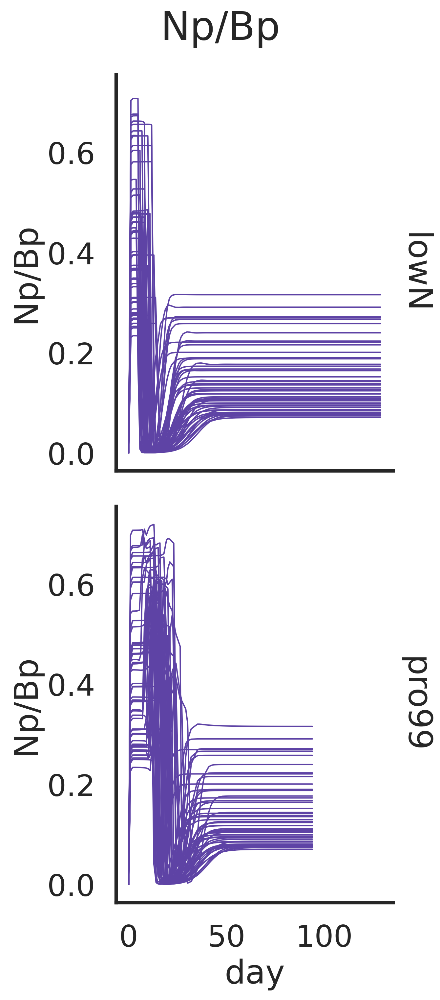

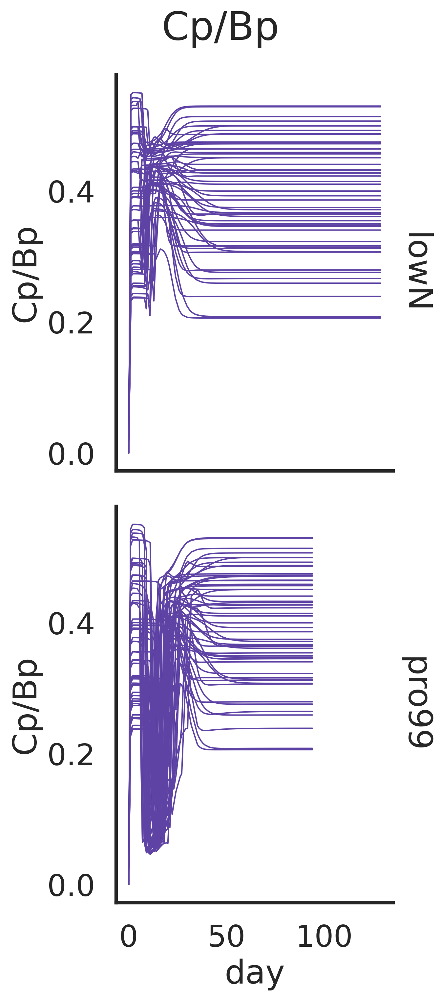

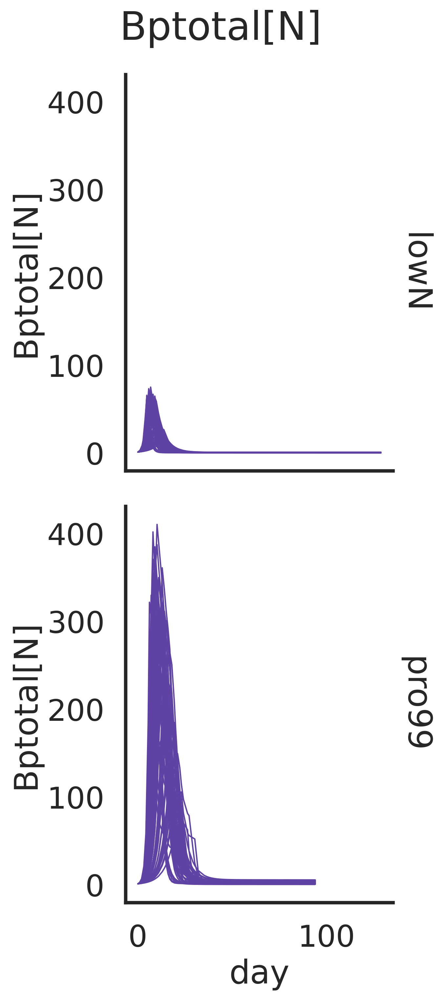

In [108]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
        row='media', row_order=media_order, lw=1,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(n, y=1.03)

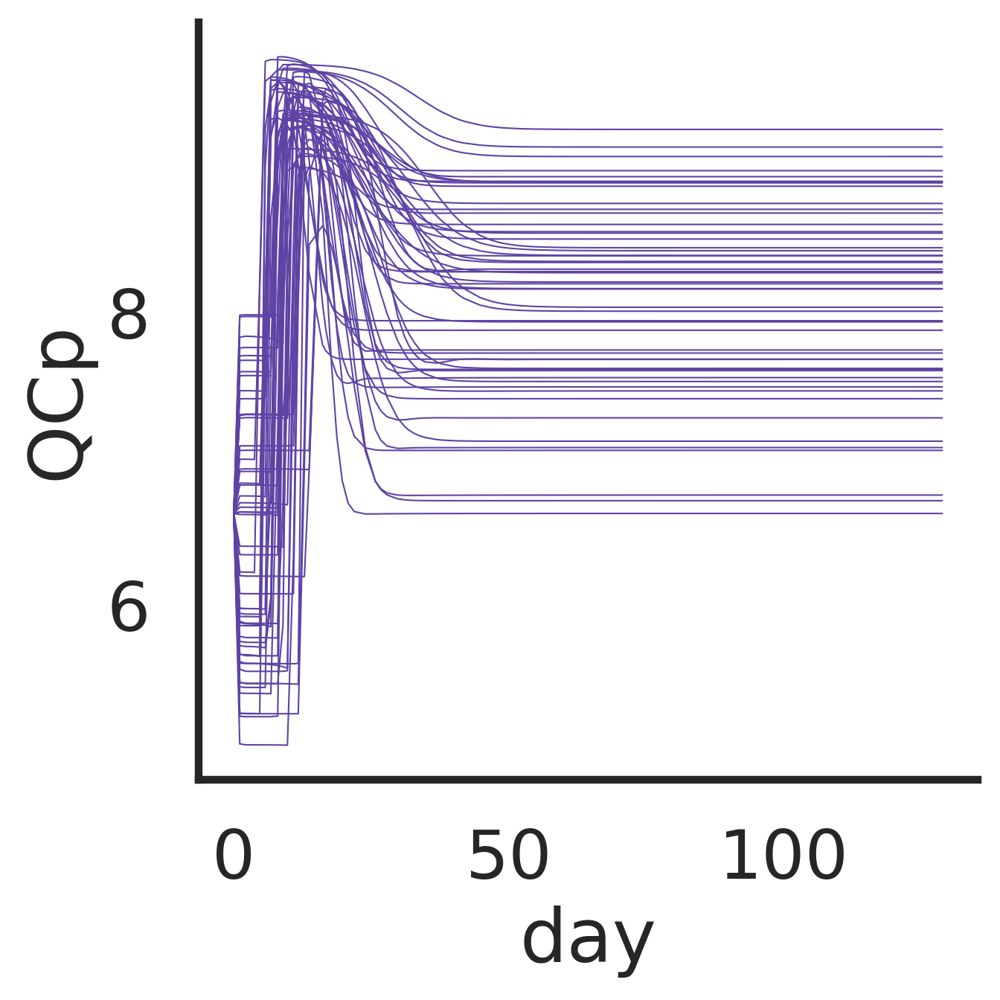

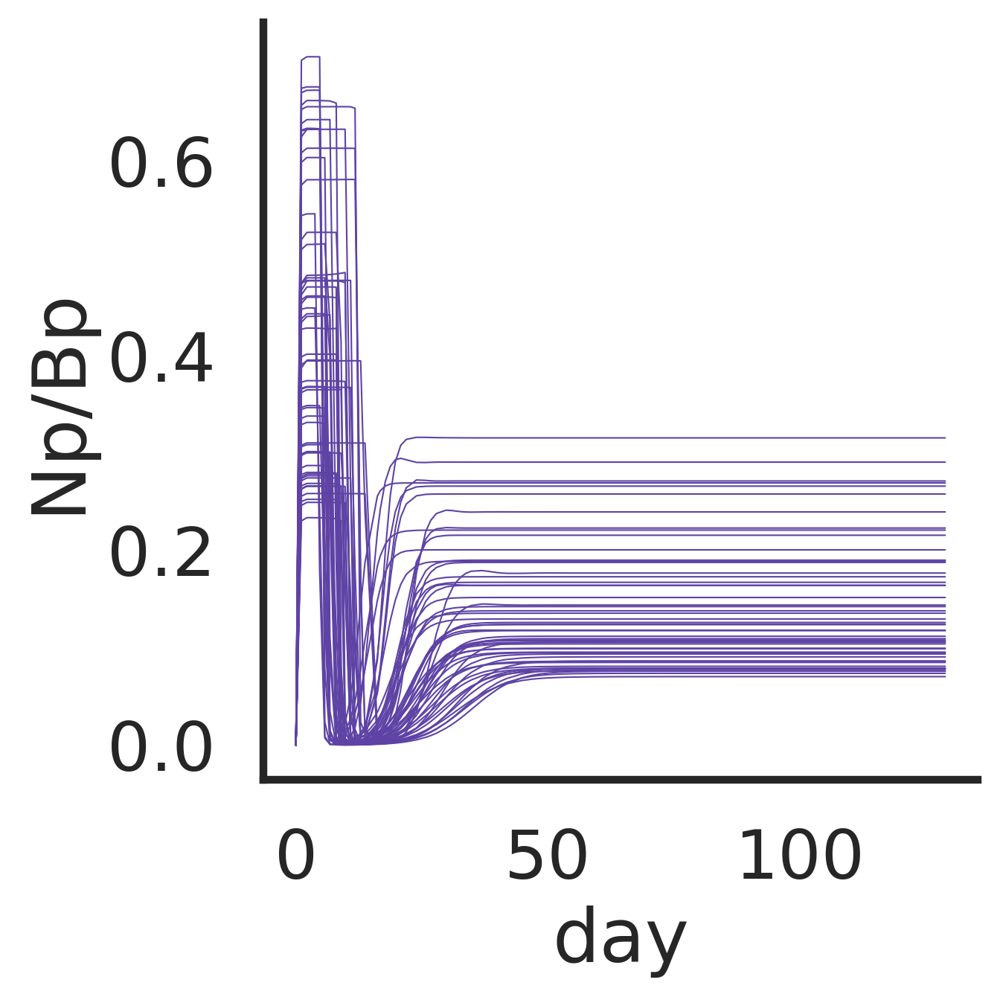

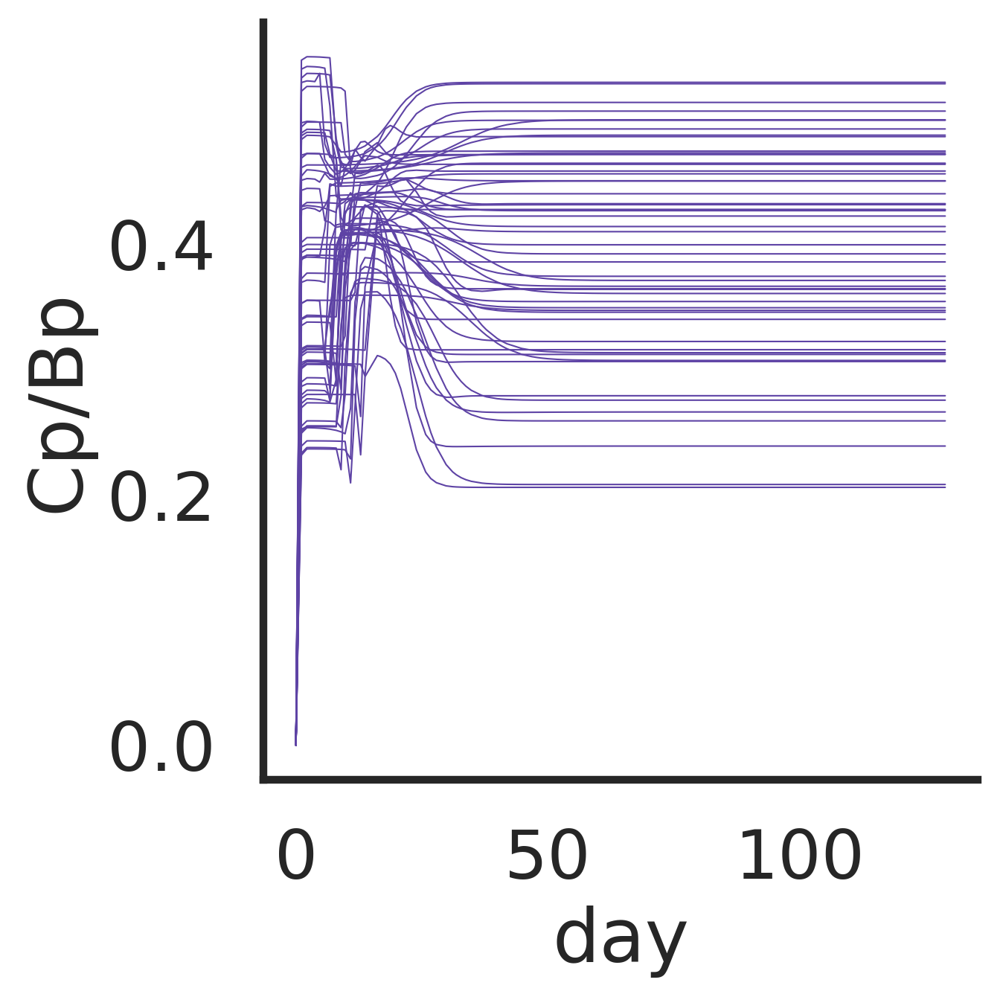

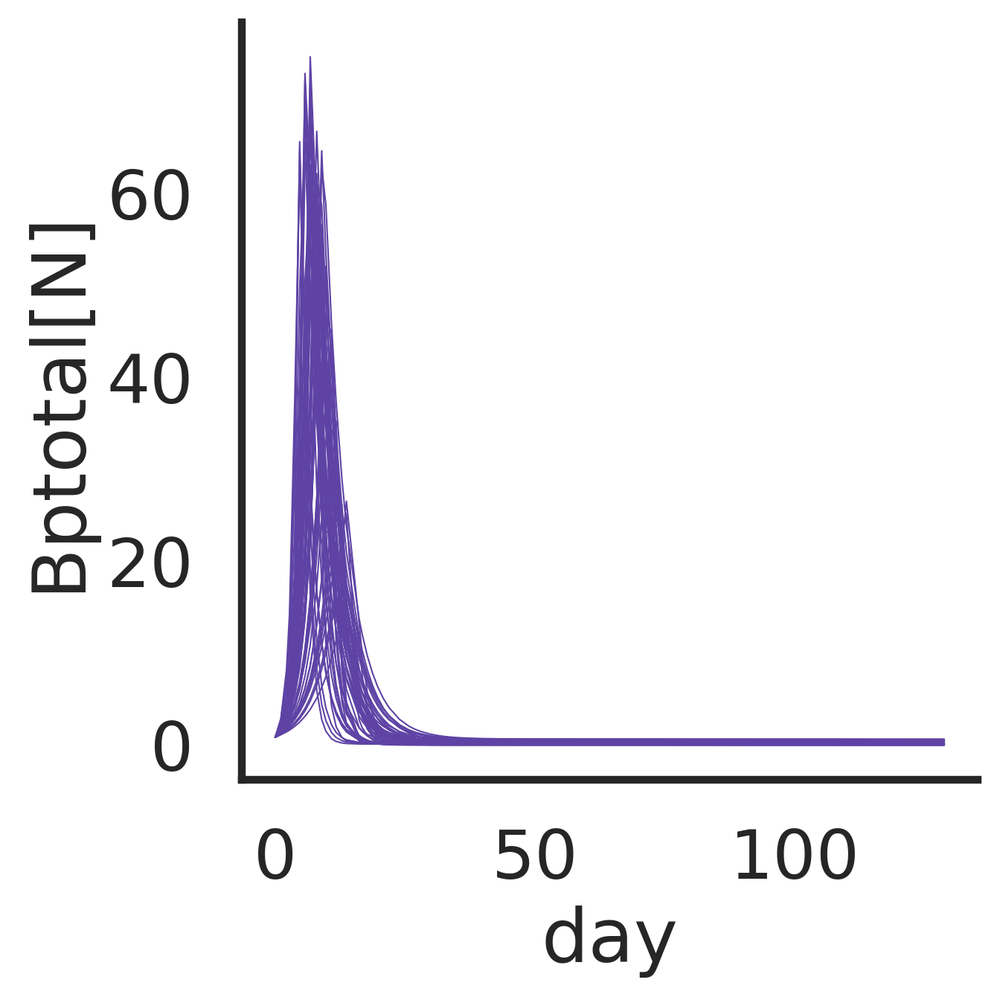

In [109]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin([('lowN')])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
                        lw=0.5,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    #g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(n, y=1.03)

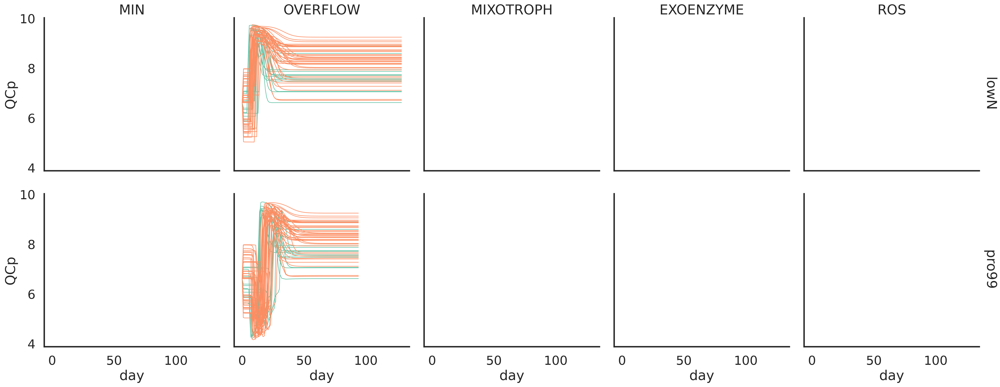

In [110]:

for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'QCp', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
#     g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [111]:
mparams_df['cluster_'] = mparams_df.cluster.fillna('bad fit')

In [112]:
mparams_df.loc[~mparams_df['FC'].isna()].variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Koverflowp'], dtype=object)

In [113]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Koverflowp', 'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp',
       'Vmax/Vmax Ip'], dtype=object)

In [114]:
sum_df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash', 'Vmax/K ICp',
       'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype='object')

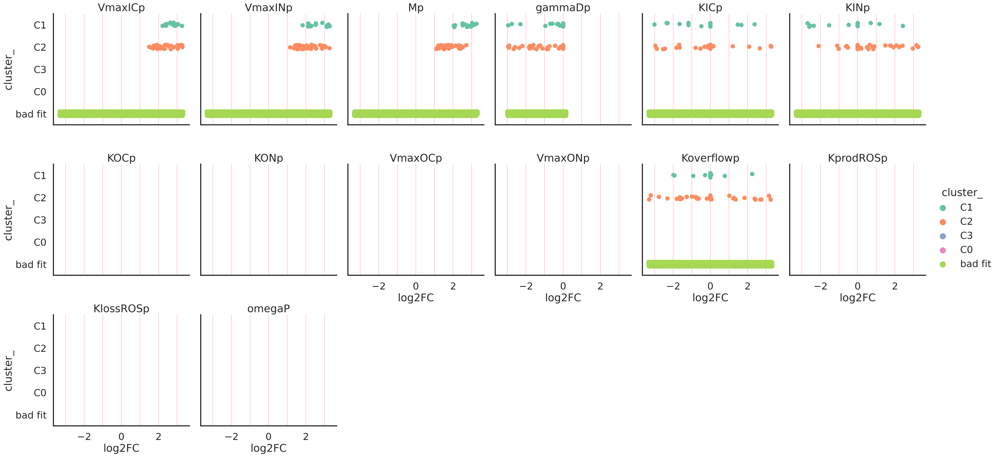

In [115]:
sns.set_context('poster')
corder1 = corder + ['C0', 'bad fit']
porder = ['VmaxICp', 'VmaxINp',  'Mp', 'gammaDp', 'KICp', 'KINp', 'KOCp',
       'KONp', 'VmaxOCp', 'VmaxONp','Koverflowp', 'KprodROSp', 'KlossROSp',
       'omegaP']
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='cluster_', col_wrap=6, order=corder1,
    hue='cluster_', hue_order=corder1, palette='Set2', s=100, 
    col_order=porder,
    #dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.8, lw=0.5)


In [116]:
mtmp1.columns

Index(['model', 'idx', 'VmaxICp', 'VmaxINp', 'Mp', 'labels',
       'log2FC(VmaxINp)/log2FC(Mp)', 'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object', name='variable')

In [117]:
mparams_df.loc[
    mparams_df.variable.isin(['VmaxICp', 'VmaxINp', 'Mp',])
    
].pivot_table(index='cluster', columns='variable', values='value', aggfunc=['mean', 'std'])*24*3600

mean                           std                    
variable        Mp   VmaxICp   VmaxINp        Mp   VmaxICp   VmaxINp
cluster                                                             
C1        0.676257  3.198629  3.099048  0.171751  0.651830  1.020299
C2        0.346070  2.683060  2.172986  0.110046  1.000118  0.897987

In [123]:
out_dpath = 'VPRO/OVERFLOW_fix'
for m in morder:
    os.makedirs(os.path.join(out_dpath, m), exist_ok=True)

In [124]:
#vpro_32_25_OVERFLOW_C2.json
cluster_ids.index.str.replace('monte_ponly_fix_OVERFLOW','vpro_2', regex=False).str.replace('_monte__', '_', regex=True)

Index(['vpro_2_35_55_OVERFLOW', 'vpro_2_85_90_OVERFLOW',
       'vpro_2_36_92_OVERFLOW', 'vpro_2_46_77_OVERFLOW',
       'vpro_2_13_19_OVERFLOW', 'vpro_2_65_37_OVERFLOW',
       'vpro_2_10_14_OVERFLOW', 'vpro_2_52_23_OVERFLOW',
       'vpro_2_13_26_OVERFLOW', 'vpro_2_66_72_OVERFLOW',
       'vpro_2_100_31_OVERFLOW', 'vpro_2_36_37_OVERFLOW',
       'vpro_2_23_78_OVERFLOW', 'vpro_2_33_12_OVERFLOW',
       'vpro_2_45_88_OVERFLOW', 'vpro_2_15_14_OVERFLOW',
       'vpro_2_18_79_OVERFLOW', 'vpro_2_75_28_OVERFLOW',
       'vpro_2_83_45_OVERFLOW', 'vpro_2_47_15_OVERFLOW',
       'vpro_2_88_4_OVERFLOW', 'vpro_2_25_66_OVERFLOW',
       'vpro_2_22_50_OVERFLOW', 'vpro_2_100_5_OVERFLOW',
       'vpro_2_80_73_OVERFLOW', 'vpro_2_94_87_OVERFLOW',
       'vpro_2_22_11_OVERFLOW', 'vpro_2_22_51_OVERFLOW',
       'vpro_2_34_47_OVERFLOW', 'vpro_2_28_18_OVERFLOW',
       'vpro_2_79_60_OVERFLOW', 'vpro_2_68_32_OVERFLOW',
       'vpro_2_30_45_OVERFLOW', 'vpro_2_58_32_OVERFLOW',
       'vpro_2_67_20_OVERFLOW',

In [125]:
import re
labeldict = cluster_ids.to_dict()['labels']
for idx in labeldict:
    ser_x = mparams_df.loc[
        mparams_df.idx.isin([idx]) & ~mparams_df.FC.isna(), ['variable', 'value']
    ]
    ser_x.index= ser_x.variable
    actual_finalX = ser_x.value.to_dict()
    vpro_id = idx.replace('monte_ponly_fix_OVERFLOW','vpro_2').replace('_monte__','_')
    #for m in morder:
        #vpro_id = vpro_id.replace(f'{m}_','', 1)
        #vpro_id = vpro_id.replace(f'_{m}','')
        #pass
    fname = vpro_id
    model = mparams_df.loc[mparams_df.idx.isin([idx])]['model'].unique()[0]
    res_fpath = os.path.join(out_dpath, model, f'{fname}.json')
    print(res_fpath)
    params2json(actual_finalX, res_fpath)


VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_35_55_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_85_90_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_36_92_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_46_77_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_13_19_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_65_37_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_10_14_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_52_23_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_13_26_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_66_72_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_100_31_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_36_37_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_23_78_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_33_12_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_45_88_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_15_14_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_18_79_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/vpro_2_75_28_OVERFLOW.json
VPRO/OVERFLOW_fix/OVERFLOW/